### LOAD PACKAGES 

In [1]:
# Importation des librairies 

import pandas as pd 
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import collections

from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from imblearn.under_sampling import RandomUnderSampler 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import f1_score,classification_report,roc_auc_score,precision_score,recall_score, precision_recall_fscore_support 
from sklearn.model_selection import GridSearchCV,train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn_som.som import SOM



pd.set_option('display.max_columns', 100)

### READ THE DATA 

In [2]:
# Lire la data stockée dans le fichier CSV. Modifier le chemin si vous relancer le kernel 
#df=pd.read_csv(r'C:\Users\anas.sory\Documents\Stage\creditcard.csv')
#train_df=pd.read_csv(r'C:\Users\MohamedAliELBOURI\Desktop\Projet\fraude-main\fraude-main\Data\archive fraude CB7\fraudTrain.csv')
#test_df=pd.read_csv(r'C:\Users\MohamedAliELBOURI\Desktop\Projet\fraude-main\fraude-main\Data\archive fraude CB7\fraudTest.csv')
import os
data_file= os.path.abspath('../../data')
full_path=data_file+'\\'+'fraudTrain.csv'
train_df=pd.read_csv(full_path)
full_path=data_file+'\\'+'fraudTest.csv'
test_df=pd.read_csv(full_path)

full_path=data_file+'\\'+'X_train_1_2_svm.csv'
xtrain_transformed_complique=pd.read_csv(full_path)
ytrain_transformed_complique=train_df['is_fraud'].iloc[:int(len(train_df)*0.8)]



### CHECK THE DATA 

In [11]:
#print(ytrain_transformed_complique.shape)
#print(xtrain_transformed_complique.shape)
#print(xtrain_transformed_complique.keys)
#print(xtrain_transformed_complique["merchant"])# = id du marchant

(1037340,)
(1037340, 32)
<bound method NDFrame.keys of          Unnamed: 0  merchant  category       amt    gender     state  \
0                 0  0.850713  0.452436 -0.407384  0.909391  0.022993   
1                 1 -0.507371 -0.569500  0.230265  0.909391  1.418535   
2                 2  0.233855 -1.591435  0.934136 -1.099638 -0.953886   
3                 3  0.084615 -1.080468 -0.157774 -1.099638 -0.046784   
4                 4 -0.228789  0.707919 -0.176730 -1.099638  1.278981   
...             ...       ...       ...       ...       ...       ...   
1037335     1037335  1.318332 -0.569500  0.686771  0.909391  1.139426   
1037336     1037336  0.099539 -0.824984 -0.318340 -1.099638  1.418535   
1037337     1037337  0.766144 -1.080468 -0.135139 -1.099638 -1.651657   
1037338     1037338 -0.348181 -1.080468  0.097323  0.909391 -1.721434   
1037339     1037339 -0.805851 -1.080468  0.141658 -1.099638 -1.232994   

              zip       lat      long  city_pop       dob  unix_time

In [49]:
print("Credit Card Fraud Detection data -  rows:",train_df.shape[0]," columns:", train_df.shape[1])

Credit Card Fraud Detection data -  rows: 1296675  columns: 23


### Preparing and splitting the data

In [50]:
cols = train_df.columns.tolist()
cols = [c for c in cols if c not in ["is_fraud"]]
target = "is_fraud"
print(cols)

#Definition des nouvelles variables X_train and Y_train
X_train = train_df[cols]
Y_train = train_df[target]

#Definition des nouvelles variables X_test and Y_test
X_test = test_df[cols]
Y_test = test_df[target]

print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)


['Unnamed: 0', 'trans_date_trans_time', 'cc_num', 'merchant', 'category', 'amt', 'first', 'last', 'gender', 'street', 'city', 'state', 'zip', 'lat', 'long', 'city_pop', 'job', 'dob', 'trans_num', 'unix_time', 'merch_lat', 'merch_long']
(1296675, 22)
(1296675,)
(555719, 22)
(555719,)


### Clustering Original data and finding outliers (with feature selection)

#### Preprocessing the data

In [51]:
# Defining selected features
features = [ 'category', 'gender', 'dob', 'city_pop', 'zip', 'amt', 'unix_time']
 #job contains unkonwn values in test
 #merchant and state too many values

X_train = X_train[features]
X_test = X_test[features]



In [52]:
# Inspecting categorical variables
#for col in X_train.columns:
#    if X_train[col].dtype == 'object':
#        print("-------------------------------------")
#        print(col)
#        print(np.unique(X_train[col].astype(str)))

In [53]:
category_to_label = {'misc_net' : 0, 'shopping_net' : 0, 'grocery_net' : 0,
                 'entertainment' : 1, 'personal_care' : 1, 'travel' : 1, 'shopping_pos':1,
                  'health_fitness' : 2, 'food_dining' : 2, 'misc_pos' : 2,
                    'gas_transport' : 3, 'grocery_pos' : 3, 'home' : 3, 'kids_pets' : 3
}
# 0 net
# 1 non essential
# 2 semi essential
# 3 essential 
categories = np.unique(X_train['category'].astype(str))
replace_list = [category_to_label[cat] for cat in categories]
X_train_transformed = X_train.copy()
X_test_transformed = X_test.copy()
X_train_transformed['category'] = X_train['category'].replace(categories, replace_list)
X_test_transformed['category'] = X_test['category'].replace(categories, replace_list)

# Convert gender to binary
X_train_transformed['gender'] = X_train['gender'].replace(['M','F'], [0,1])
X_test_transformed['gender'] = X_test['gender'].replace(['M','F'], [0,1])

# Define age
from datetime import date
from datetime import datetime

def calculateAge(birthDate):
    birthDate = datetime.strptime(birthDate, '%Y-%m-%d').date()
    today = date.today()
    age = today.year - birthDate.year - ((today.month, today.day) <(birthDate.month, birthDate.day))
    return age

X_train_transformed['dob'] = X_train_transformed['dob'].apply(calculateAge)
X_test_transformed['dob'] = X_test_transformed['dob'].apply(calculateAge)

In [54]:
# Scaling the data
columns = X_train_transformed.columns
print(type(X_train_transformed))
scaler = StandardScaler()
scaler.fit(X_train_transformed)
X_train_transformed = scaler.transform(X_train_transformed)
X_test_transformed = scaler.transform(X_test_transformed)

<class 'pandas.core.frame.DataFrame'>


#### making my first SelfOrganizingMaping

In [55]:
# declaration des variables
largeur=9
longueure=9
nombre_de_models= 2#50  = 5h d'executions min
# je met les indices dans x et y pour l'affichage

tab_nb_fraud=dict()
percent=dict()
if 'saving' not in globals():#deprecated
    saving=[]
if 'saving_train' not in globals():
    saving_train=[]
if 'saving_test' not in globals():
    saving_test=[]
if 'predictions' not in globals():
    predictions=np.ndarray(shape=(largeur*longueure,), dtype=numpy.int64, order='F')

x=np.arange(0,longueure)
y=np.arange(0,largeur)
z=np.zeros(largeur*longueure)

In [129]:

#return tab_nb_fraud qui contien le nombre de fraudes de chaques clusters
# par exemple tab_nb_fraud[0] = [12377  320]
def generate_nb_fraud(mode="train"):
    tab_nb_fraud=dict()
    index=0
    if (mode=="train"):
        while index < len(Y_train):
            if predictions[index] not in tab_nb_fraud.keys():
                tab_nb_fraud[predictions[index]]=[0,0]
            if Y_train[index]==1:
                # prediction[25]= 2 ---> la donnée 25 est dans le cluster2
                tab_nb_fraud[ predictions[index]][1] =1+tab_nb_fraud[ predictions[index]][1]
            else:
                tab_nb_fraud[ predictions[index]][0] =1+tab_nb_fraud[ predictions[index]][0]
            index=index+1
    if (mode=="test"):
        while index < len(Y_test):
            if predictions[index] not in tab_nb_fraud.keys():
                tab_nb_fraud[predictions[index]]=[0,0]
            if Y_test[index]==1:
                tab_nb_fraud[ predictions[index]][1] =1+tab_nb_fraud[ predictions[index]][1]
            else:
                tab_nb_fraud[ predictions[index]][0] =1+tab_nb_fraud[ predictions[index]][0]
            index=index+1
    #print(tab_nb_fraud)
    return tab_nb_fraud

def generate_nb_fraud_complique():
    tab_nb_fraud=dict()
    index=0
    while index < len(predictions):
        if predictions[index] not in tab_nb_fraud.keys():
            tab_nb_fraud[predictions[index]]=[0,0]
        if ytrain_transformed_complique[index]==1:
            # prediction[25]= 2 ---> la donnée 25 est dans le cluster2
            tab_nb_fraud[ predictions[index]][1] =1+tab_nb_fraud[ predictions[index]][1]
        else:
            tab_nb_fraud[ predictions[index]][0] =1+tab_nb_fraud[ predictions[index]][0]
        index=index+1
    #print(tab_nb_fraud)
    return tab_nb_fraud

# return le pourcentage de fraudes de chaques clusters
def generate_percent():
    percent=dict()
    for cluster in tab_nb_fraud:
        percent[cluster]= tab_nb_fraud[cluster][1]/(tab_nb_fraud[cluster][0]+tab_nb_fraud[cluster][1])
    return percent

### from 400 to 20 20
def convert_base(val,base):
    unite=val%base
    dizaine = (val-unite)/base 
    return dizaine,unite

def best_cluster(mass_min=1000):# renvie le numero du meilleur cluster
    best_cluster=0
    best_percent=0
    current_percent=best_percent
    for cluster in tab_nb_fraud:# seulement les cluster de taille 1000 sont ecouté
        if(tab_nb_fraud[cluster][1]+tab_nb_fraud[cluster][0]>mass_min):
            current_percent= tab_nb_fraud[cluster][1]/(tab_nb_fraud[cluster][0]+tab_nb_fraud[cluster][0])
            if (current_percent>best_percent):
                best_percent=current_percent
                best_cluster=cluster
    
    return best_cluster


# il y a beaucoup a changer ici
# il faut renvoyer les clusters avec les infos importantes
# cet a dire le pourcent du cluster et les data qui sont dedan
# forme attendue [[0.56][52 125 ... 54545 77455]]  [[0.06][99 155 ... 54555 15455]]
def probably_10_best_clusters(mass_min=1000):# renvie le numero du meilleur cluster
    best_clusters=[]
    cluster=[0,0] #doit contenir [percent mass]
    moy=sorted(moyenne_qui_passe_certaines_saves(),reverse=True)
    current_percent=moy[0]
    cluster[0]=current_percent
    index=0
    clusters_trouvé=1
    while(index <len(moy)):
        if(current_percent==moy[index]):
            cluster[1]= cluster[1]+1
        else:#j'ai trouve un nouveau cluster
            best_clusters.append(cluster[:])
            current_percent=moy[index]
            cluster[0]=current_percent
            cluster[1]=1
            clusters_trouvé=clusters_trouvé+1
        
        if (clusters_trouvé>10):
            index=len(moy)+1
        index=index+1    
    return best_clusters
   

def affiche(z,title="mass"):
    z_local=z[:]
    z_local[:] = [x if x != -1 else 0 for x in z_local]
    fig = plt.figure(figsize=(8,8),dpi=80)#ecrit gros pour pouvoir lire
    ax = fig.add_subplot(projection='3d')
    
    ax.set_title(title,fontsize=16,loc='left')
    hist, xedges, yedges = np.histogram2d(x, y, bins=largeur, range=[[0,largeur ], [0, longueure]])

    # Construct arrays for the anchor positions of the bars.
    xpos, ypos = np.meshgrid(xedges[:-1] , yedges[:-1], indexing="ij")
    xpos = xpos.ravel()
    ypos = ypos.ravel()
    zpos = 0

    # Construct arrays with the dimensions for the bars.
    dx = dy = 0.5 * np.ones_like(zpos)


    ax.bar3d(xpos, ypos, zpos, dx, dy, z_local, zsort='average')
    plt.show()

# savve le percent de chaque data = on oublie le cluster 
def save(size=len(predictions),mode="test"):
    #print("prediction_id = ",id(predictions)," prediction_size ",size)
    #print("percent_id    = ",id(percent))
    une_iteration=[]
    i=0
    non_classifié=0
    while i < size:
        #predictions[i]= le numero du cluster le la donnée i
        #percent[i]= le pourcent du cluster i
        if( predictions[i] in percent.keys()):
            une_iteration.append( percent[ predictions[i] ]  )
        else:
            une_iteration.append(-1) 
            non_classifié=non_classifié+1
        i=i+1
    #print("une_iteration    = ",len(une_iteration))   
    if (mode == "train"):
        print(id(saving_train))
        saving_train.append(list(une_iteration))
    if (mode == "test"):
        print(id(saving_test))
        saving_test.append(list(une_iteration))
        #saving.append(list(une_iteration)) #deprecated
        print(str(non_classifié)+" element on été classé dans un cluster qui etait vide dans train")
    #print("prediction_id fin de save = ",id(predictions))
    #print("percent_id    fin de save = ",id(percent))
    
def reset():
    if("saving" in globals()):
        saving[:]=list()
    saving_train[:]=list()
    saving_test[:]=list()

def lisser_small_clusters():# ne marche pas 
    average=sum(percent.values())/len(percent)
    for cluster in percent:#haut percent et peut de data
        if (percent[cluster] >0.10)and(tab_nb_fraud[cluster][1]+tab_nb_fraud[cluster][0]<1000):
            print ("faux cluster trouvé")
            percent[cluster]=average
    print (percent)

    
def moyenne(big_number=len(predictions),mode="test"):#renvoie une liste qui est la moyenne de saving
    moyenne=[]
    numero_data=0
    if(mode=="test"):
        
        if 'saving_test' not in globals():
            print ("saving_test non initialisé")
            return False
        while(numero_data<big_number):
            iteraton_actuelle=0
            summ=0
            while (iteraton_actuelle< nombre_de_models):
                if(saving_test[iteraton_actuelle][numero_data] != -1):
                    summ=summ+saving_test[iteraton_actuelle][numero_data]
                iteraton_actuelle=iteraton_actuelle+1
            summ=summ/nombre_de_models
            moyenne.append(summ)
            numero_data=numero_data+1
    if(mode=="train"):
        if 'saving_train' not in globals():
            print ("saving_train non initialisé")
            return False
        while(numero_data<big_number):
            iteraton_actuelle=0
            summ=0
            while (iteraton_actuelle< nombre_de_models):
                if(saving_train[iteraton_actuelle][numero_data] != -1):
                    summ=summ+saving_train[iteraton_actuelle][numero_data]
                iteraton_actuelle=iteraton_actuelle+1
            summ=summ/nombre_de_models
            moyenne.append(summ)
            numero_data=numero_data+1
    return moyenne

#je n'enregistrait pas quand le % du cluster etait inconue
#donc les saves etait de tailles inegales
def moyenne_qui_passe_certaines_saves(big_number=len(predictions),mode="test"):
    moyenne=[]
    numero_data=0
    if(mode=="test"):
        while(numero_data<big_number):
            iteraton_actuelle=0
            summ=0
            while (iteraton_actuelle< nombre_de_models):
                if(len(saving_test[iteraton_actuelle])==big_number):
                    if(saving_test[iteraton_actuelle][numero_data] != -1):
                        summ=summ+saving_test[iteraton_actuelle][numero_data]
                iteraton_actuelle=iteraton_actuelle+1
            summ=summ/nombre_de_models
            moyenne.append(summ)
            numero_data=numero_data+1
        
    if(mode=="train"):
        while(numero_data<big_number):
            iteraton_actuelle=0
            summ=0
            while (iteraton_actuelle< nombre_de_models):
                if(len(saving_train[iteraton_actuelle])==big_number):
                    if(saving_train[iteraton_actuelle][numero_data] != -1):
                        summ=summ+saving_train[iteraton_actuelle][numero_data]
                iteraton_actuelle=iteraton_actuelle+1
            summ=summ/nombre_de_models
            moyenne.append(summ)
            numero_data=numero_data+1
    return moyenne



def affiche_moyenne():
    #moy=sorted(moyenne(),reverse=True)
    moy=sorted(moyenne_qui_passe_certaines_saves(),reverse=True)
    x =np.arange(0,len(moy))
    y =np.array(moy)
    
    plt.plot(moy)
    plt.ylabel('some numbers')
    plt.show()
    i=0
    while(i<len(moy)):
        if(moy[i] < 0.20):
            print(str(i)+" values au dessus de 20% ")
            break
        i=i+1
    while(i<len(moy)):
        if(moy[i] < 0.05):
            print(str(i)+" values au dessus de 5% ")
            break
        i=i+1
    while(i<len(moy)):
        if(moy[i] < 0.02):
            print(str(i)+" values au dessus de 2% ")
            break
        i=i+1
#def estimate_test_percent_from_train_cluster():
    #executer SOM sur les donnée de test = 
    # j'associe a chaque data un numero de cluster 
    #le percent de ce cluster a ete estimé a la phase  "train"
    # et il est dans percent[]

def camembert():
    # n'affiche que le dernier model , mais bon la notion de cluster se perd
    #avec les moyenne , et le camembert n'a plus de sens
    label_pie=[]
    i=0
    while i < largeur*longueure:
        label_pie.append(str(i))
        i=i+1
    plt.pie(np.array(list(tab_nb_fraud.values()))[:,1],labels=tab_nb_fraud.keys(),normalize=True)
    plt.figure(figsize = (8, 8))
    plt.plot()
    plt.pie(percent.values(),labels=percent.keys(),normalize=True)
    plt.figure()

    
    

In [124]:
def execution_SOM(affichage="all"):
    index =0
    if("saving_train" not in globals() or "saving_test" not in globals()):
        print ("saving non initialisé")
        return False
    reset()
    while (index<nombre_de_models):
        #calcul
        som = SOM(m=largeur, n=longueure, dim=7,max_iter=100000)# , max_iter = 1)
        som.fit(X_train_transformed, epochs =1)
        predictions = som.predict(X_train_transformed)
        #sauvgarder les resultats
        tab_nb_fraud=generate_nb_fraud("train")
        percent=generate_percent()
        save(mode="train")
        #afficher
        if(affichage=="all" or affichage=="only_train"):
            print("-----------------------------------------------------------")
            print("-----------------------------------------------------------")
            print("-----------------------------------------------------------")
            print("best_cluster train ="+str(best_cluster()))
            z[list(percent.keys())] = list(percent.values())
            affiche(z,"train_percent")
            z[list(tab_nb_fraud.keys())] = list(np.array(list(tab_nb_fraud.values()))[:,1])
            affiche(z,"train_mass")


        #essai sur test
            #j'associe un cluster a chaque data
        predictions = som.predict(X_test_transformed)
        if(affichage=="all"):
            tab_nb_fraud=generate_nb_fraud("test")#pour afficher
        #percent=generate_percent()

        save(mode="test")  #<----- j'enregistre le % du cluster de chaque data 
                # % qui n'a pas été mis a jour donc il s'agit du % de train
        #afficher
        if(affichage=="all"):
            print("best_cluster test ="+str(best_cluster()))
            z[list(tab_nb_fraud.keys())] = list(np.array(list(tab_nb_fraud.values()))[:,1])
            affiche(z,"test_mass")
        index=index+1

max_iter atteint
prediction_id =  2203869763184  prediction_size  1296675
percent_id    =  2203455271680
une_iteration    =  1296675
2202456163136
0 element on été classé dans un cluster qui etait vide dans train
prediction_id fin de save =  2203869763184
percent_id    fin de save =  2203455271680
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =75


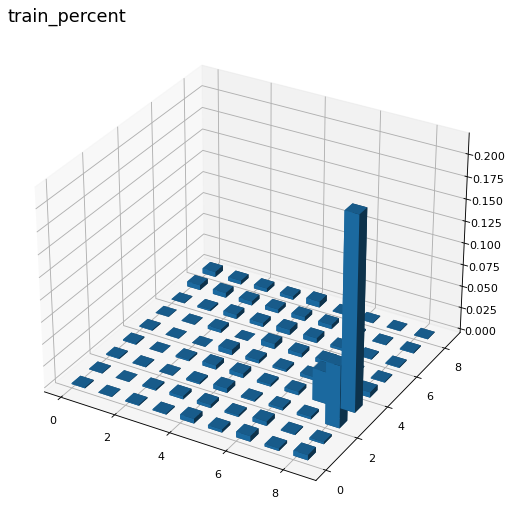

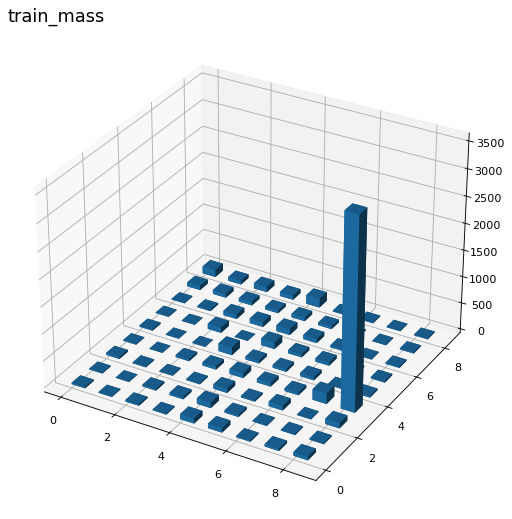

prediction_id =  2203869763184  prediction_size  1296675
percent_id    =  2203455271680
une_iteration    =  1296675
2202456162432
0 element on été classé dans un cluster qui etait vide dans train
prediction_id fin de save =  2203869763184
percent_id    fin de save =  2203455271680
best_cluster test =75


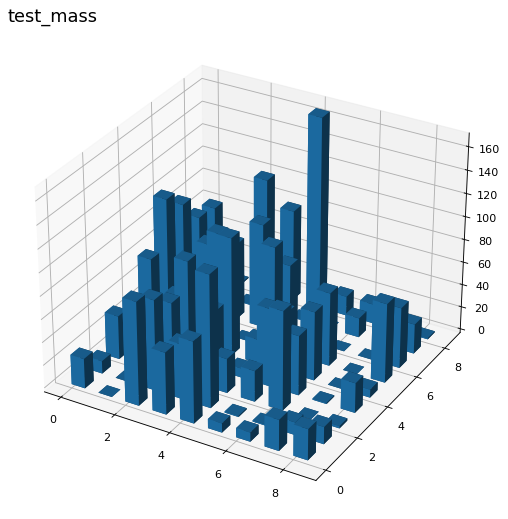

max_iter atteint
prediction_id =  2203869763184  prediction_size  1296675
percent_id    =  2203455271680
une_iteration    =  1296675
2202456163136
0 element on été classé dans un cluster qui etait vide dans train
prediction_id fin de save =  2203869763184
percent_id    fin de save =  2203455271680
-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
best_cluster train =75


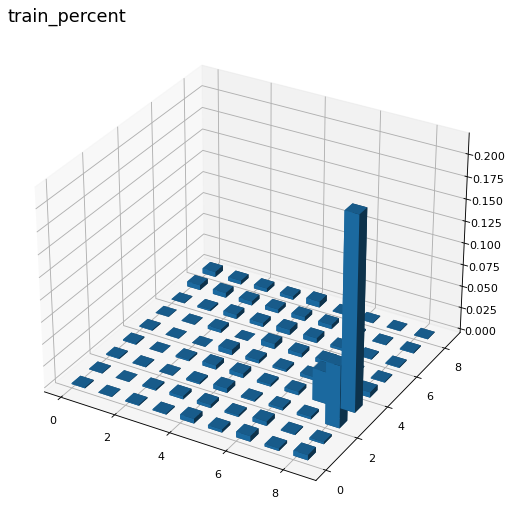

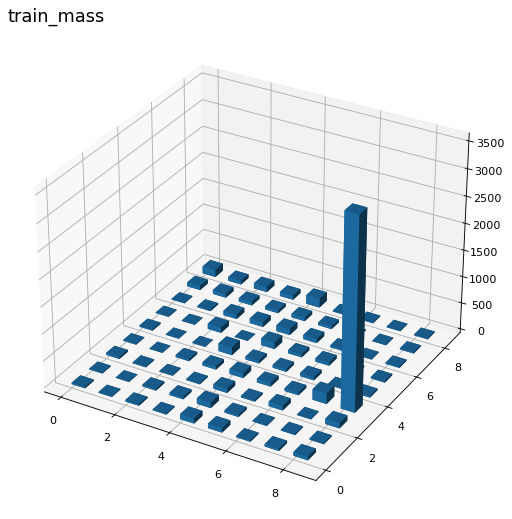

prediction_id =  2203869763184  prediction_size  1296675
percent_id    =  2203455271680
une_iteration    =  1296675
2202456162432
0 element on été classé dans un cluster qui etait vide dans train
prediction_id fin de save =  2203869763184
percent_id    fin de save =  2203455271680
best_cluster test =75


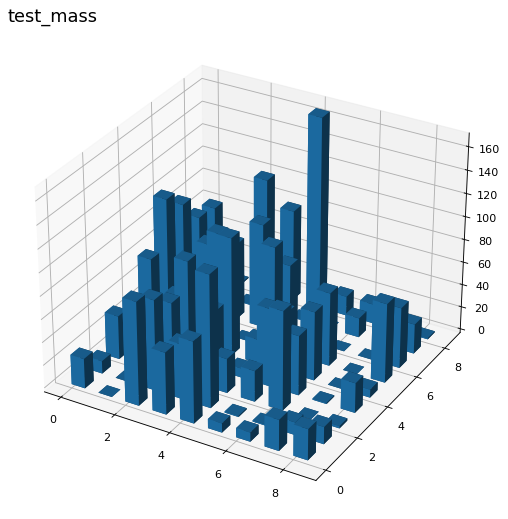

In [127]:
execution_SOM()

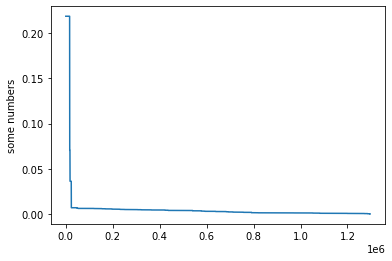

16313 values au dessus de 20% 
17706 values au dessus de 5% 
23211 values au dessus de 2% 


In [128]:
affiche_moyenne()

In [157]:
import time

start = time.time()#14h23
som = SOM(m=largeur, n=longueure, dim=7,max_iter=100000)# , max_iter = 1)
som.fit(X_train_transformed, epochs =1)
print("--- %s seconds ---" % (time.time() - start));start = time.time()

predictions = som.predict(X_train_transformed)
print("--- %s seconds ---" % (time.time() - start));start = time.time()

max_iter atteint
--- 193.8611032962799 seconds ---
--- 133.84882593154907 seconds ---


In [158]:

start = time.time()#14h23
som = SOM(m=largeur, n=longueure, dim=7,max_iter=1000)# , max_iter = 1)
som.fit(X_train_transformed, epochs =1)
print("--- %s seconds ---" % (time.time() - start));start = time.time()

predictions = som.predict(X_train_transformed)
print("--- %s seconds ---" % (time.time() - start));start = time.time()

max_iter atteint
--- 145.84063410758972 seconds ---
--- 133.91693425178528 seconds ---


max_iter atteint
best_cluster train =45


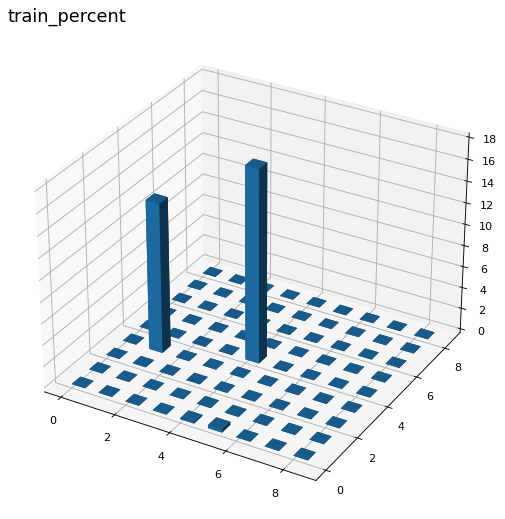

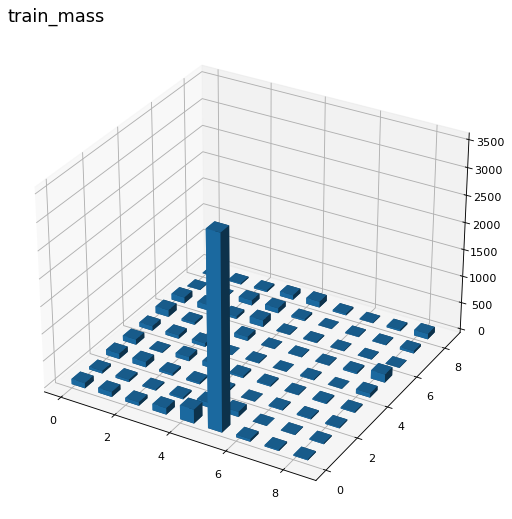

2559 element on été classé dans un cluster qui etait vide dans train
best_cluster test =45


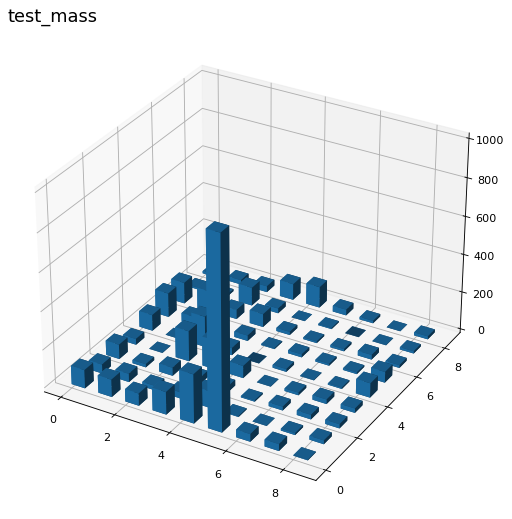

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =8


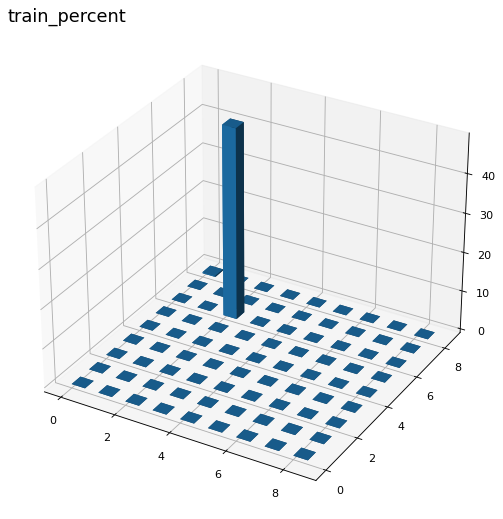

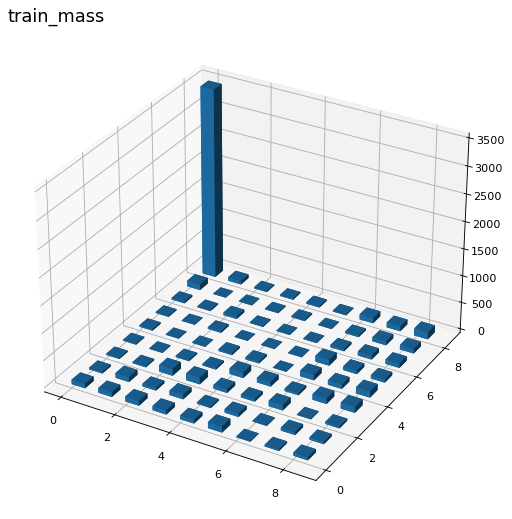

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =8


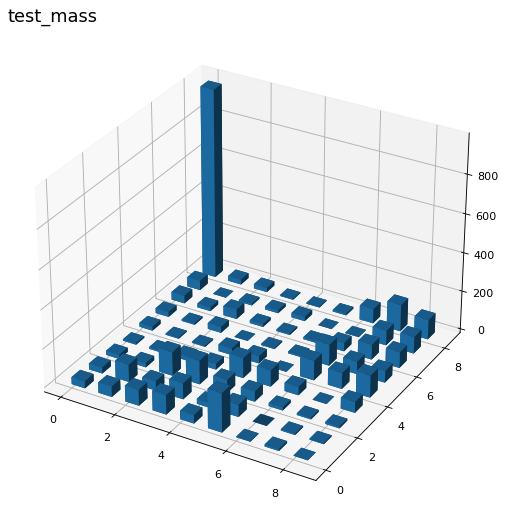

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =53


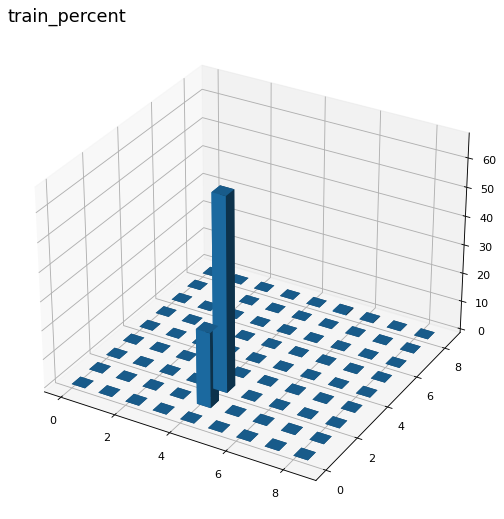

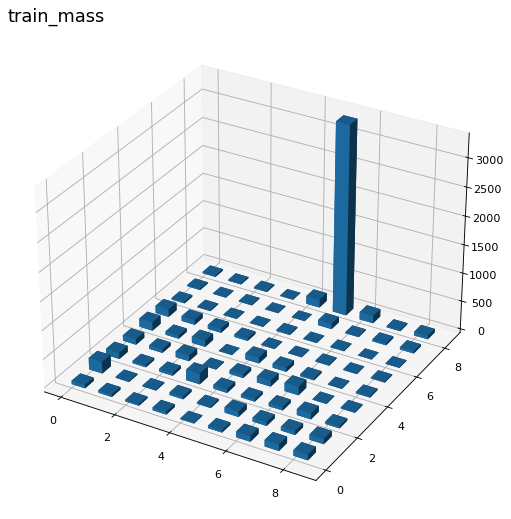

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =53


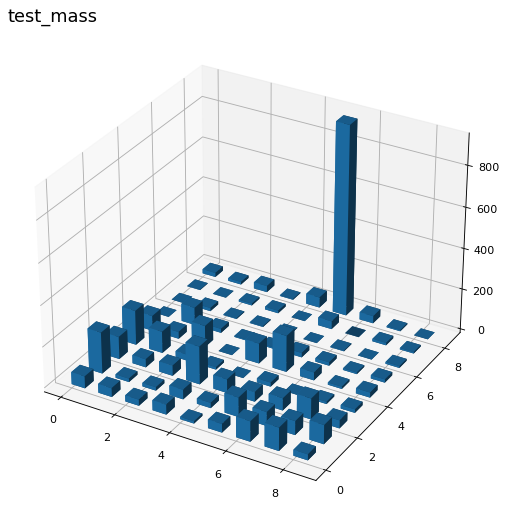

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =62


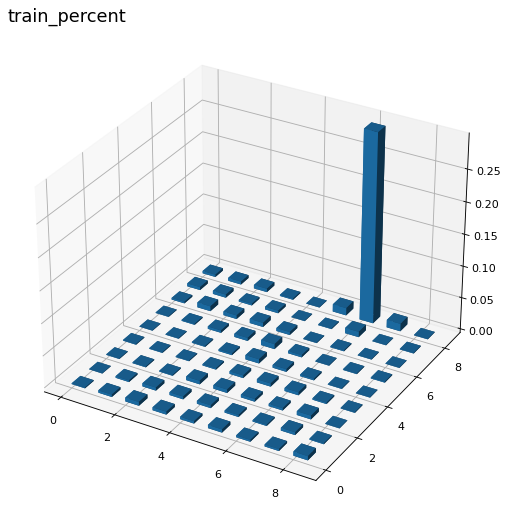

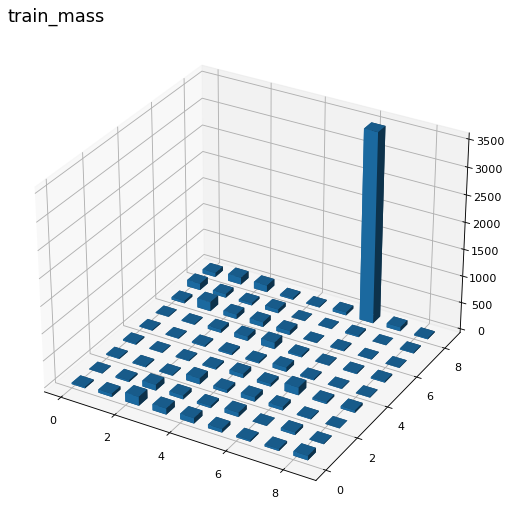

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =62


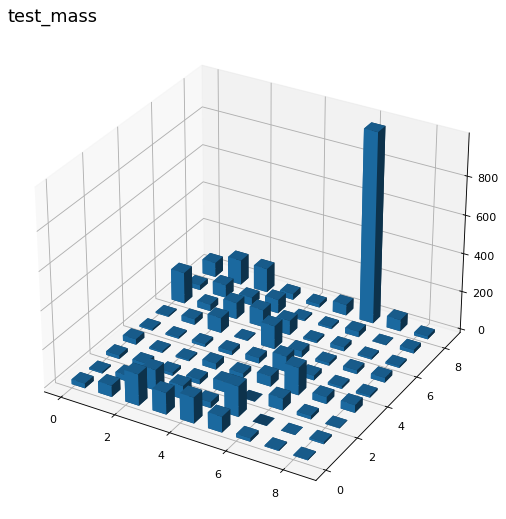

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =3


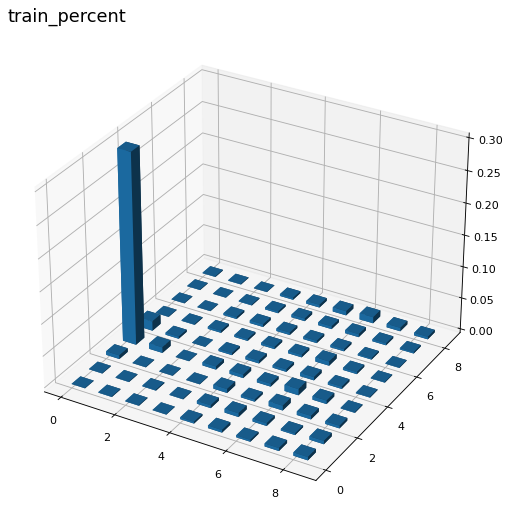

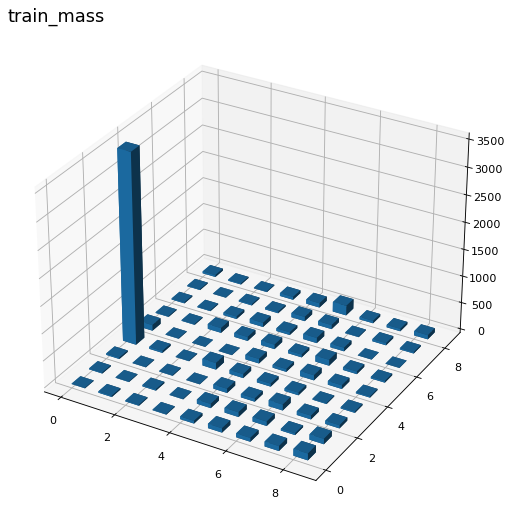

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =3


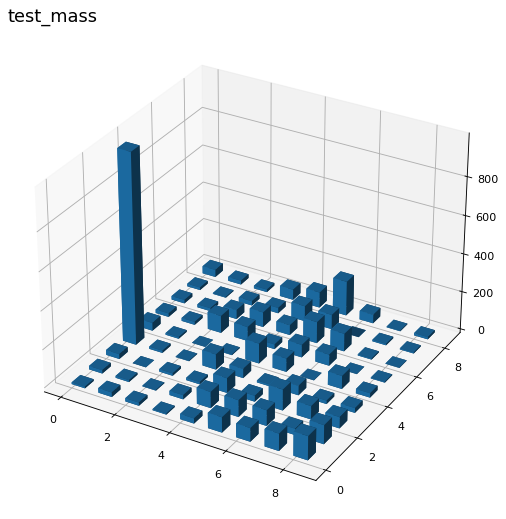

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =72


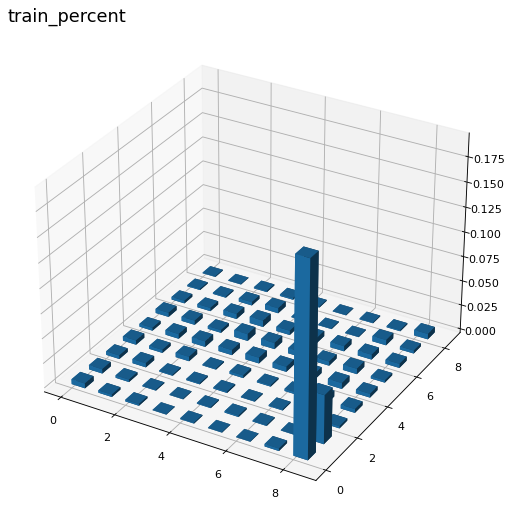

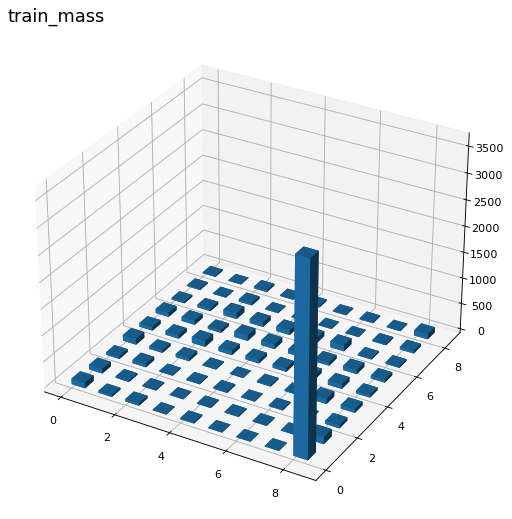

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =72


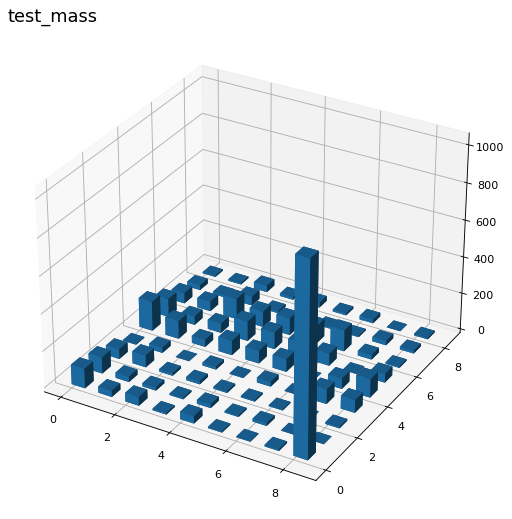

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =8


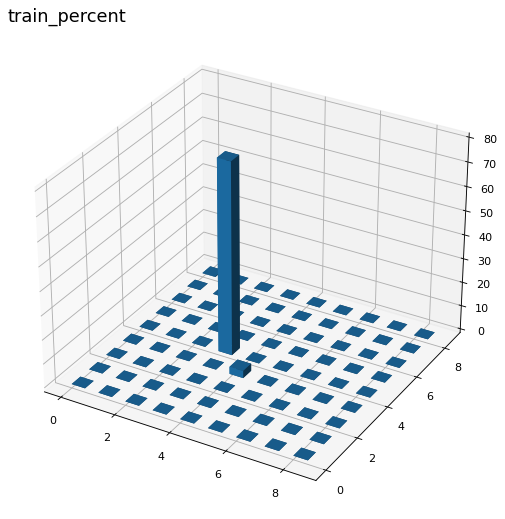

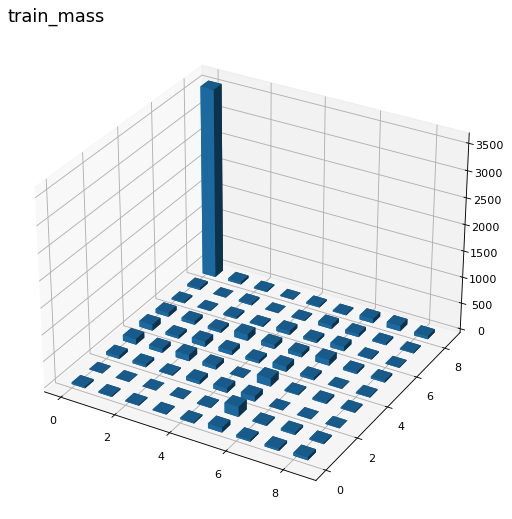

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =8


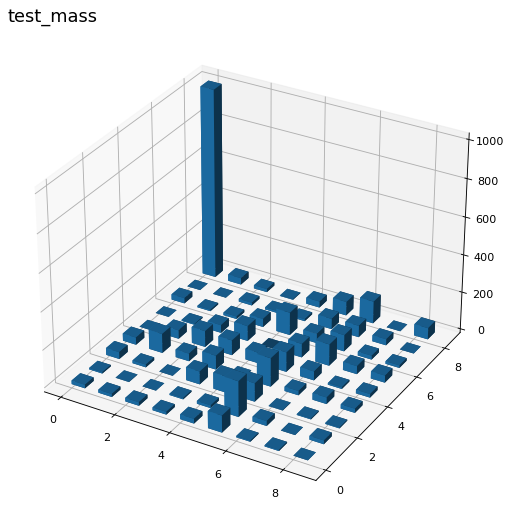

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =3


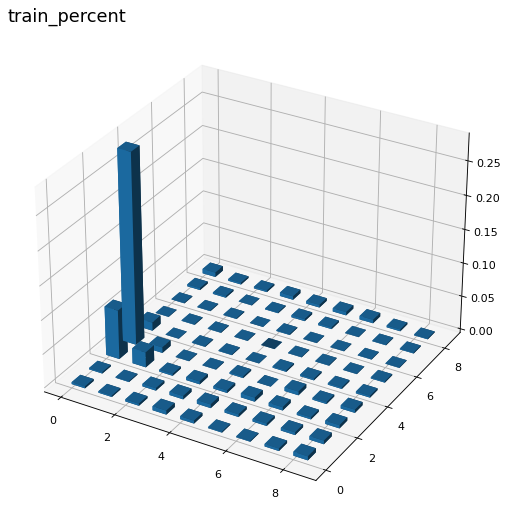

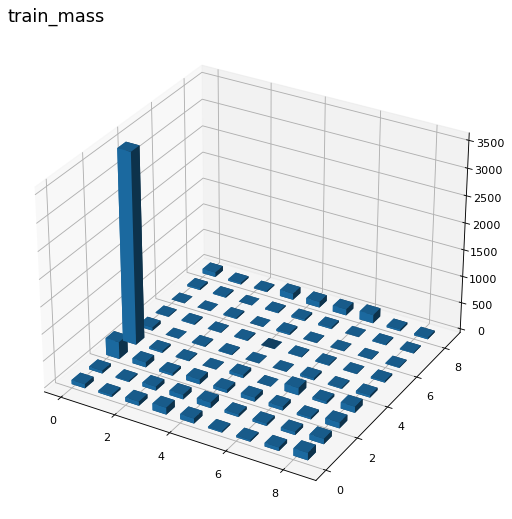

3708 element on été classé dans un cluster qui etait vide dans train
best_cluster test =3


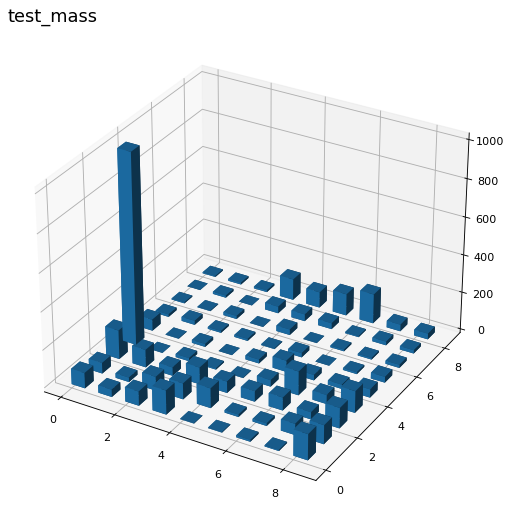

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =74


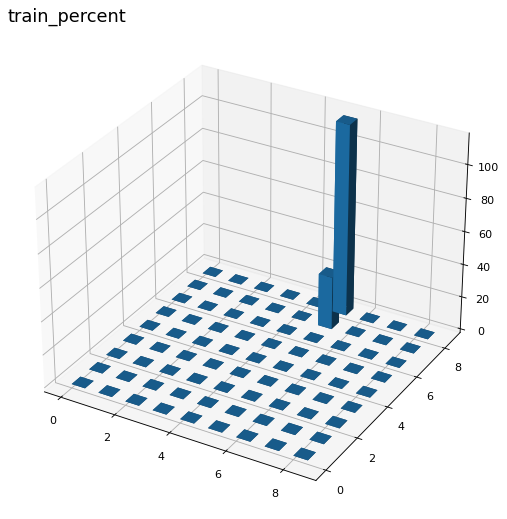

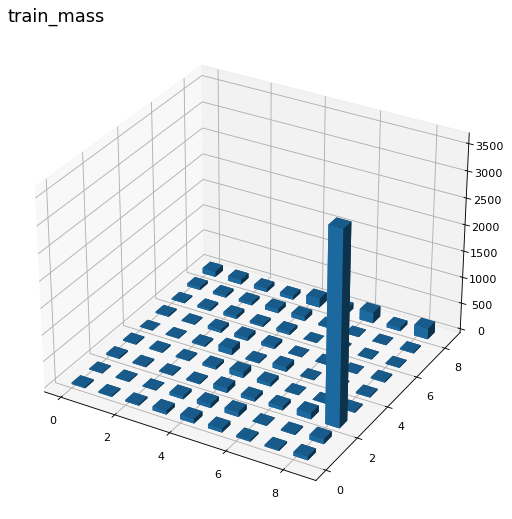

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =74


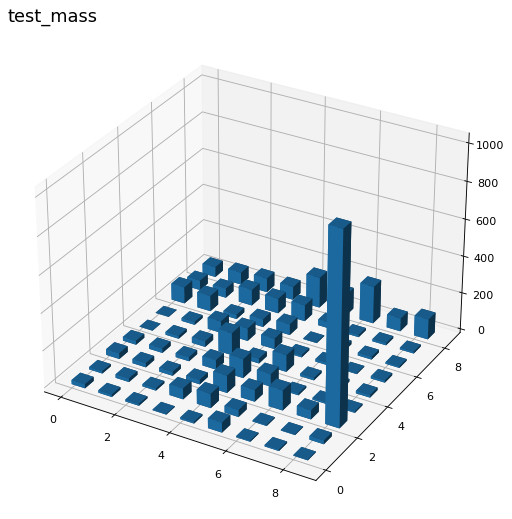

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =27


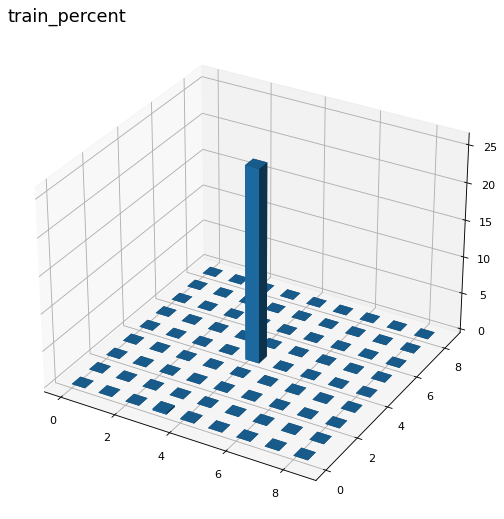

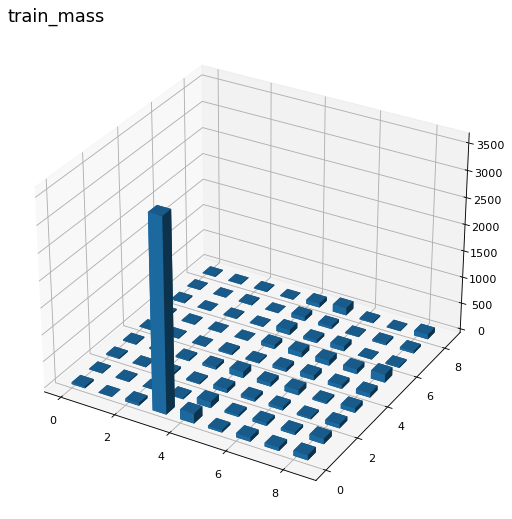

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =27


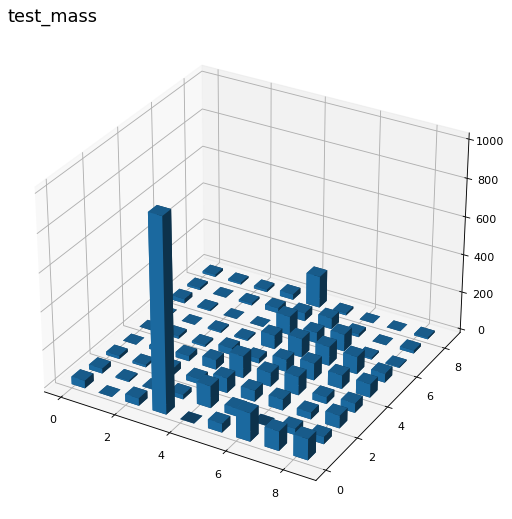

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =22


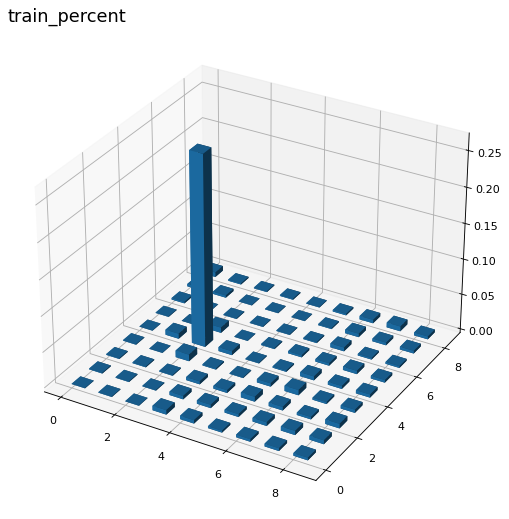

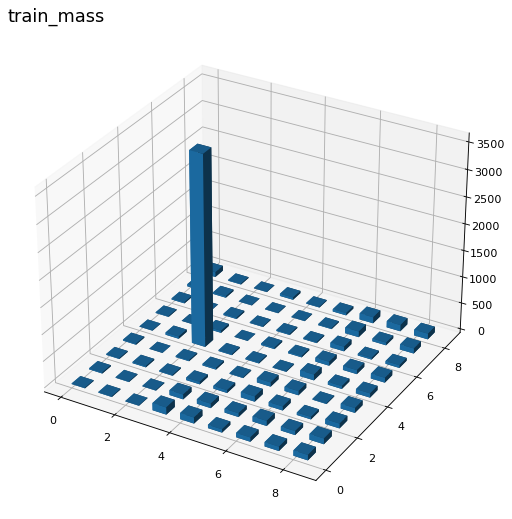

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =22


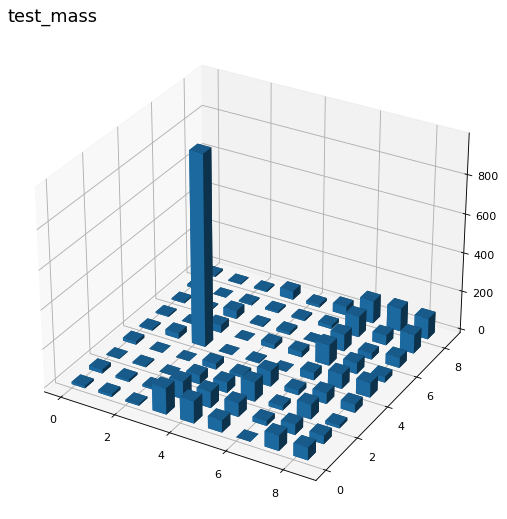

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =72


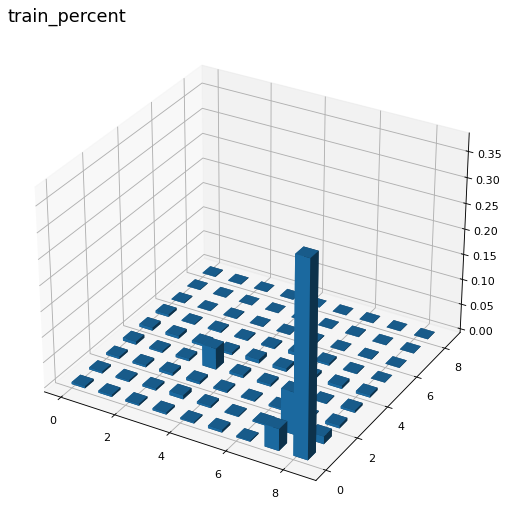

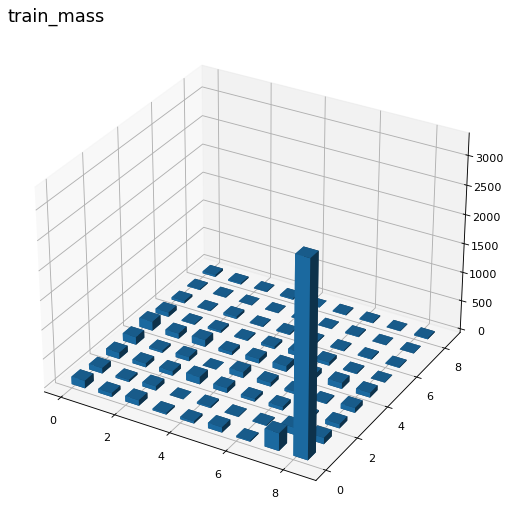

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =72


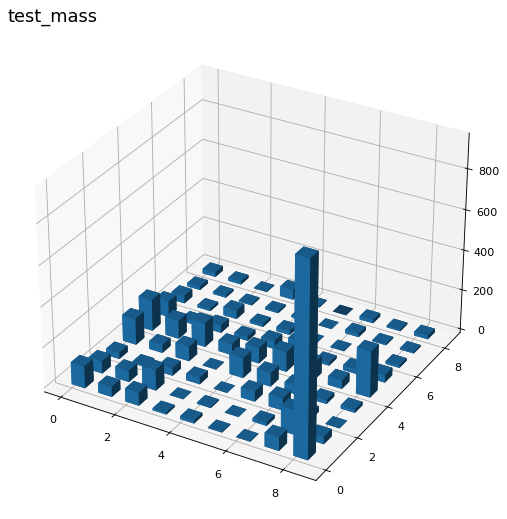

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =8


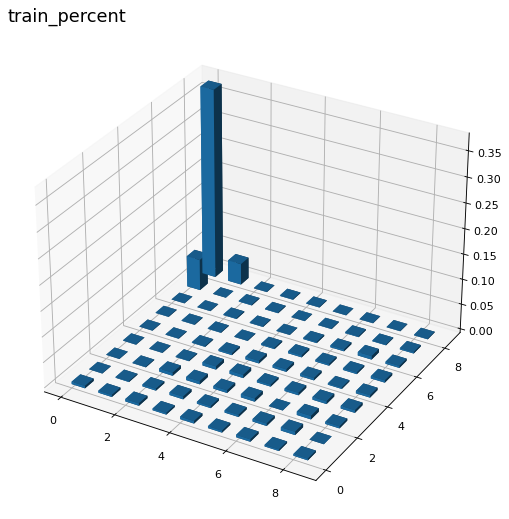

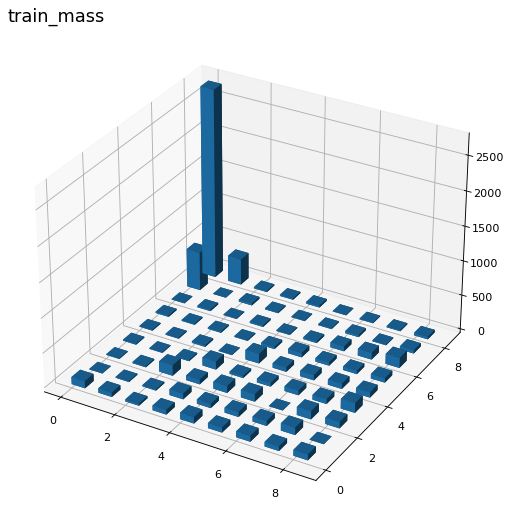

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =8


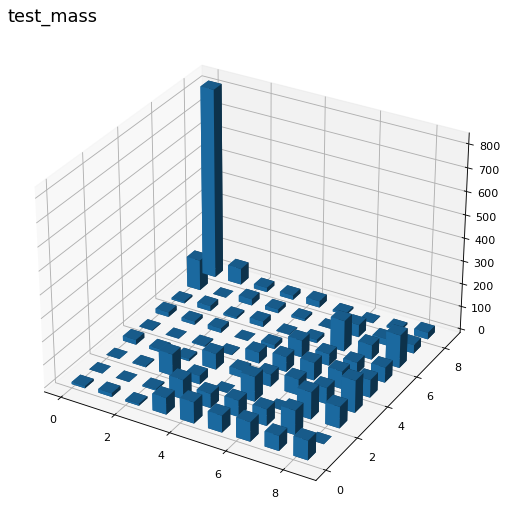

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =35


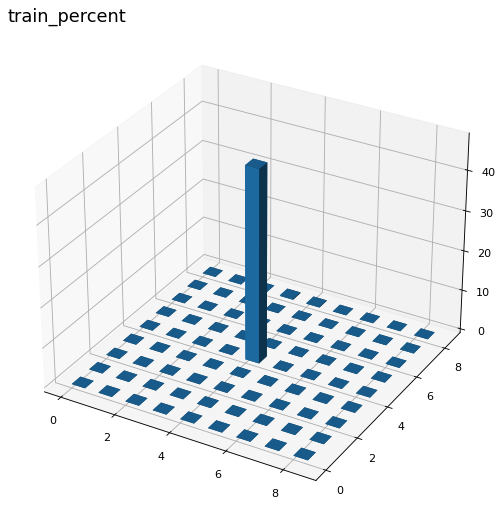

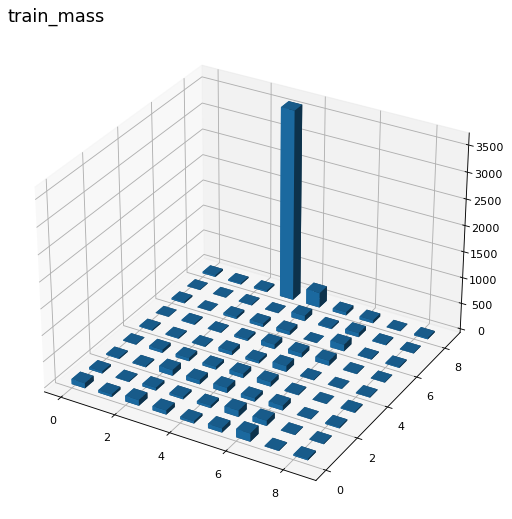

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =35


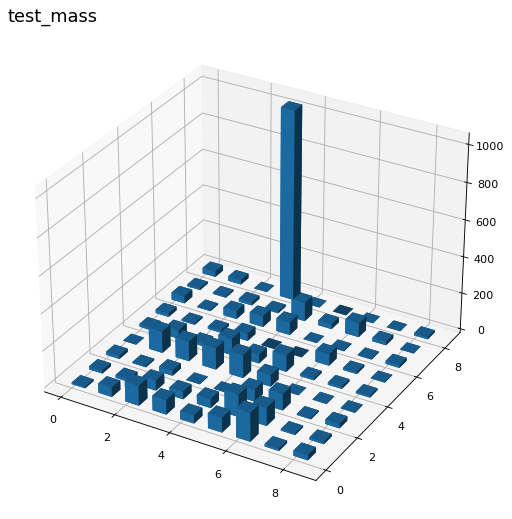

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =54


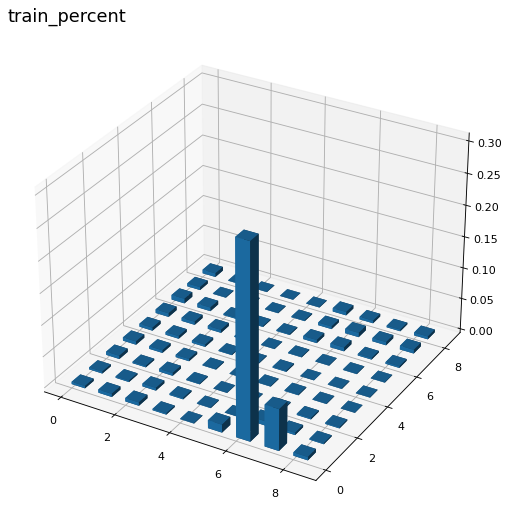

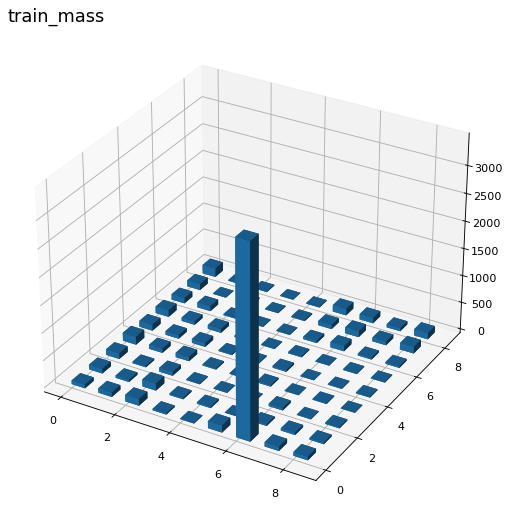

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =54


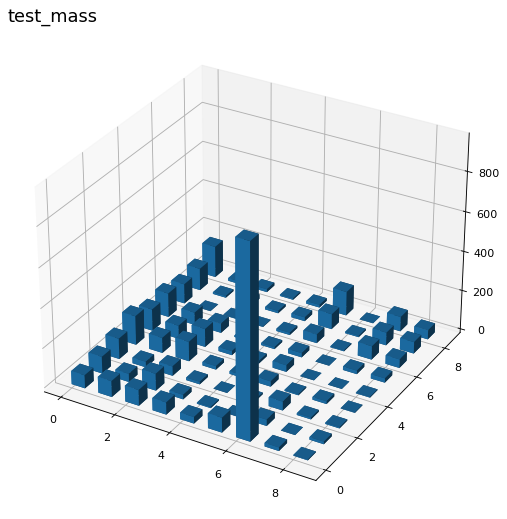

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =72


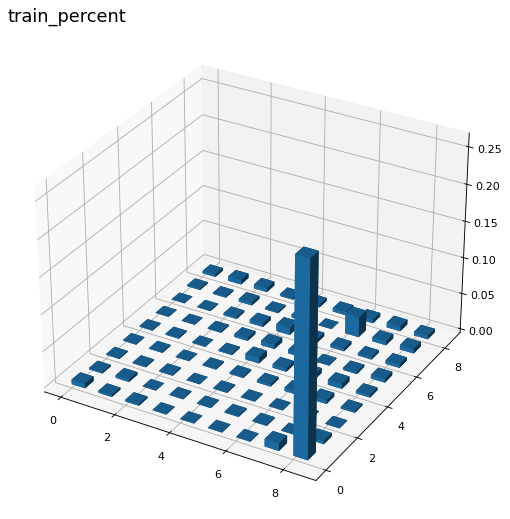

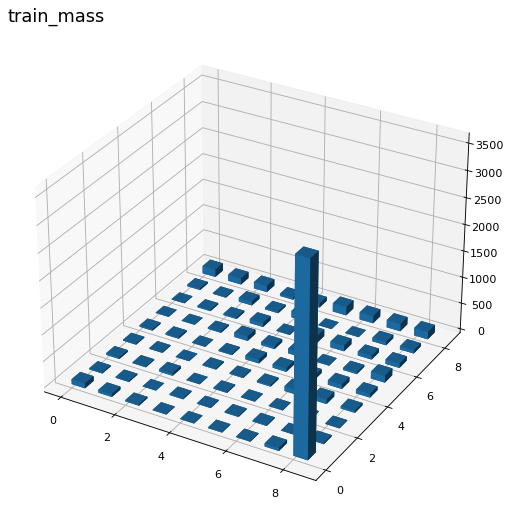

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =72


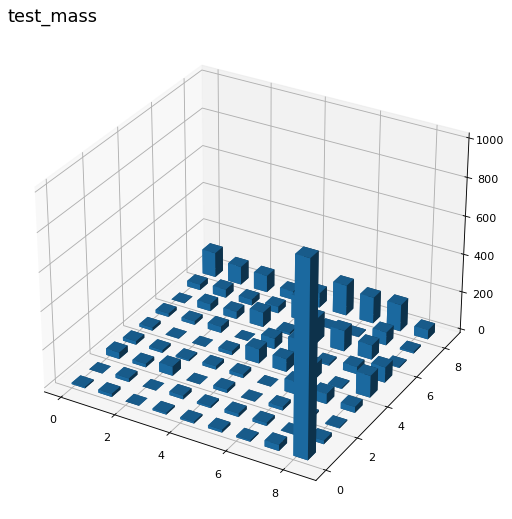

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =0


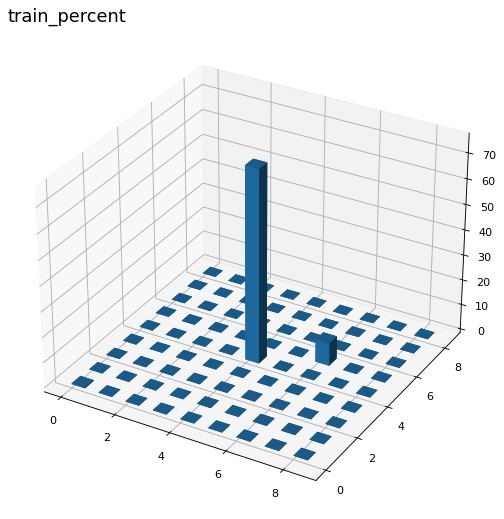

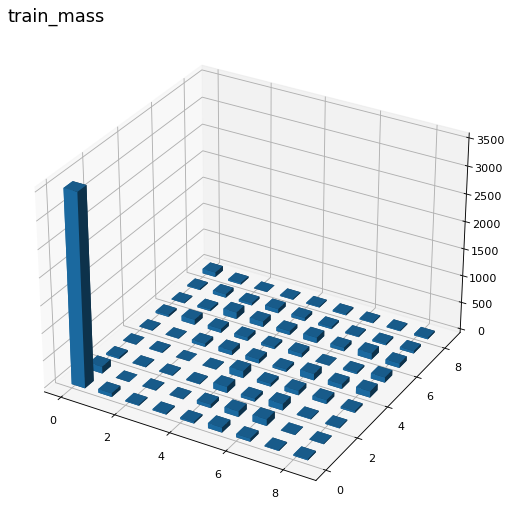

3 element on été classé dans un cluster qui etait vide dans train
best_cluster test =0


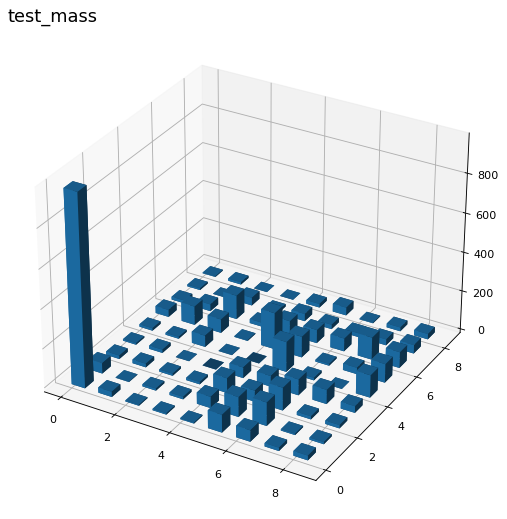

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =72


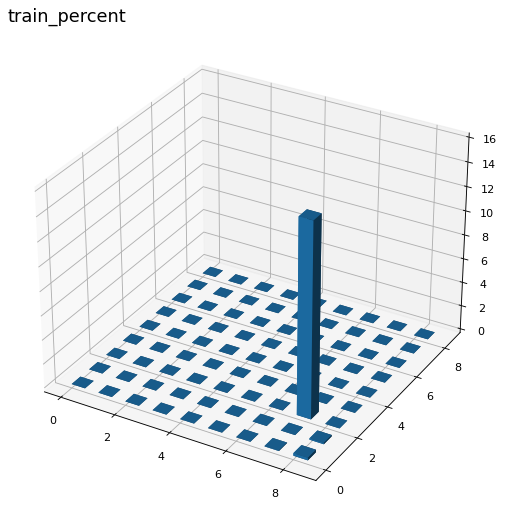

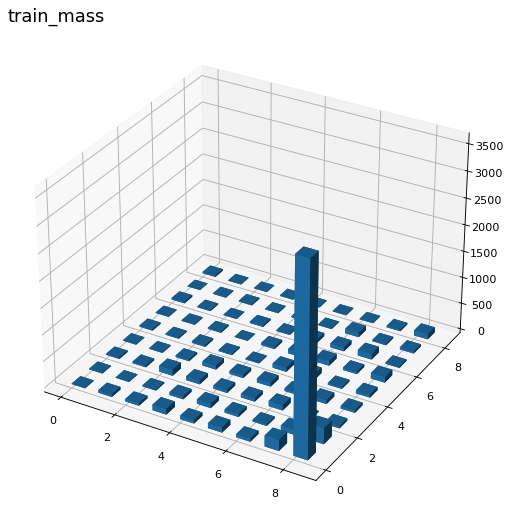

3724 element on été classé dans un cluster qui etait vide dans train
best_cluster test =72


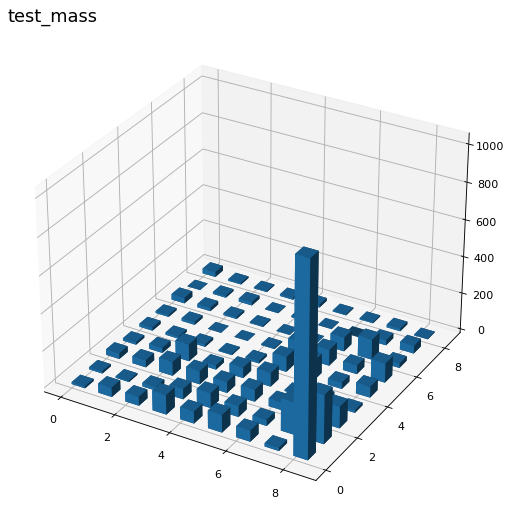

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =75


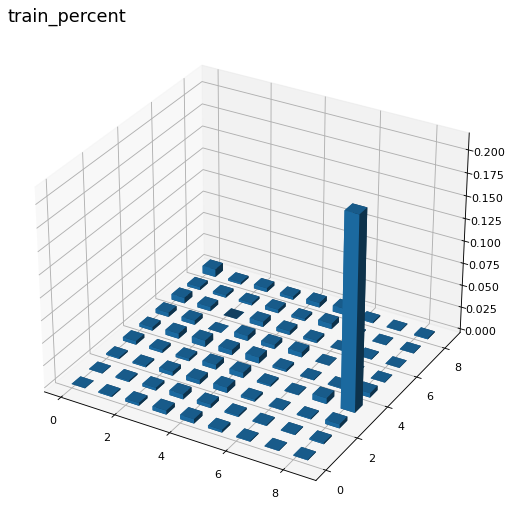

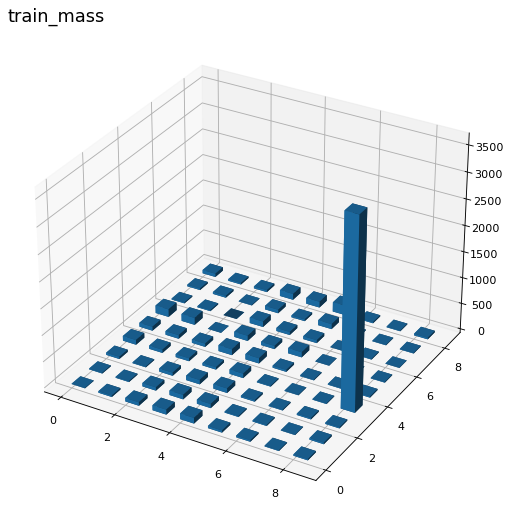

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =75


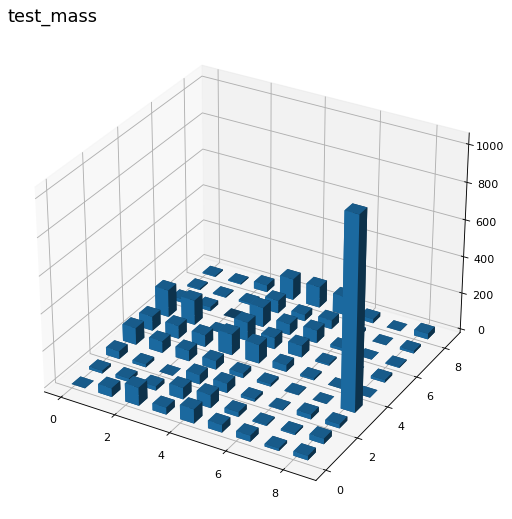

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =54


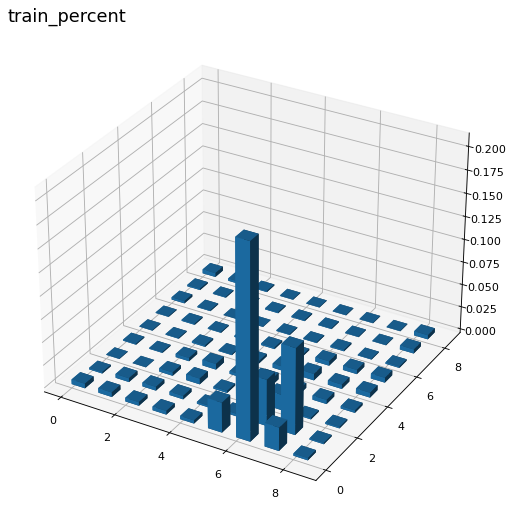

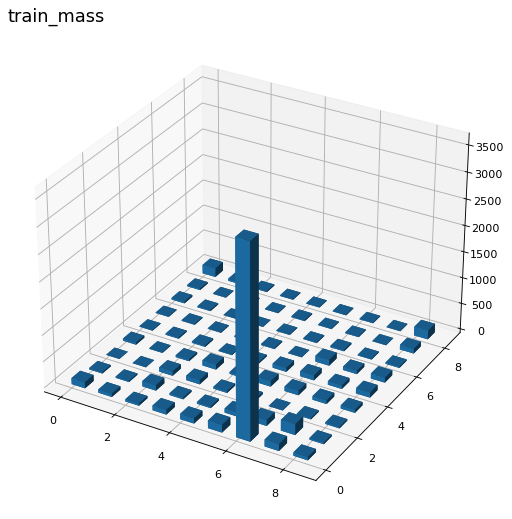

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =54


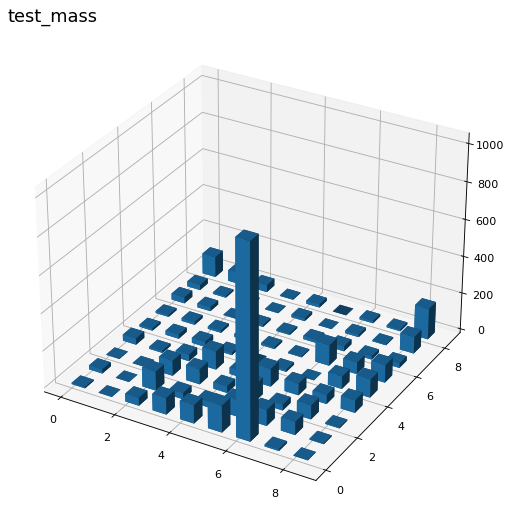

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =76


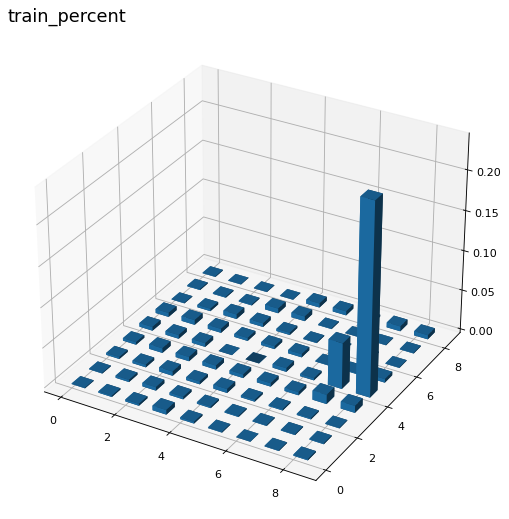

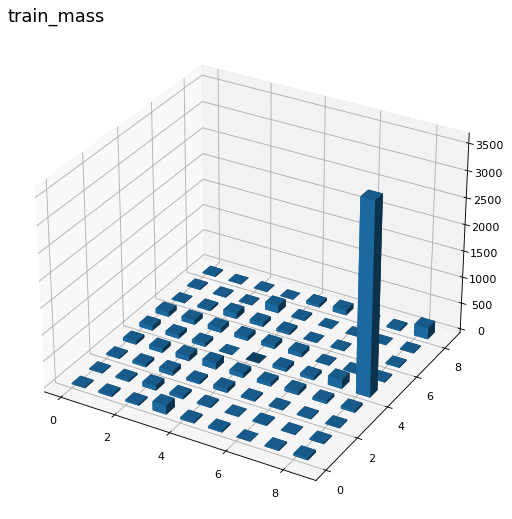

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =76


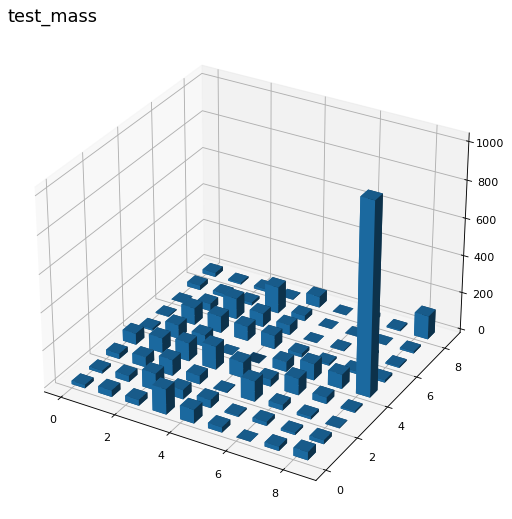

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =0


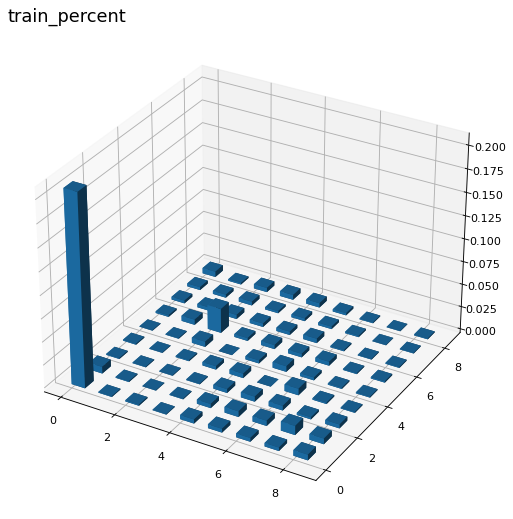

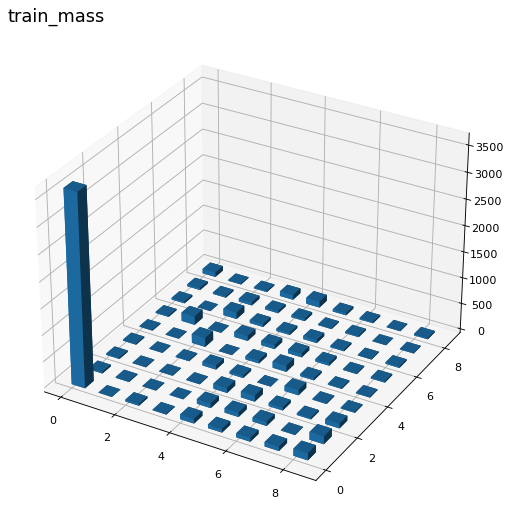

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =0


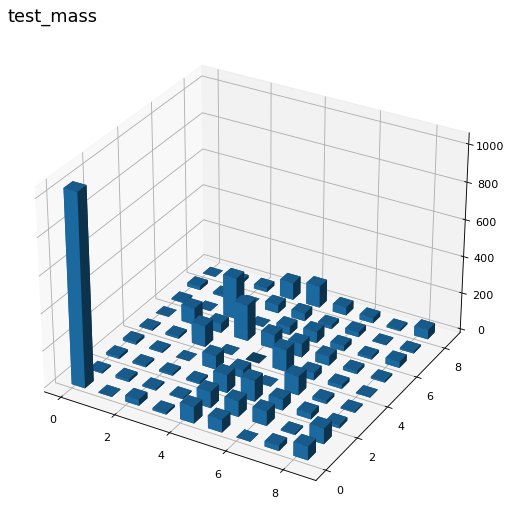

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =80


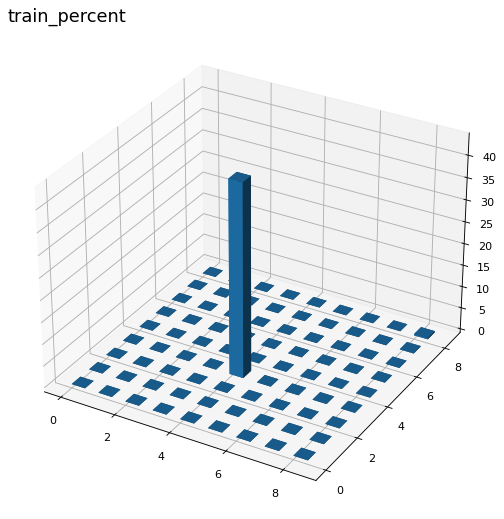

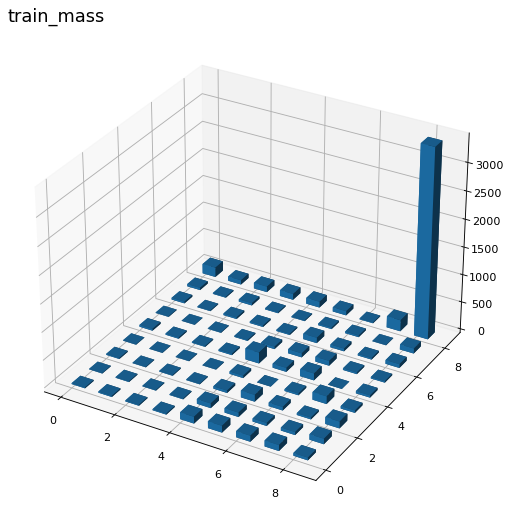

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =80


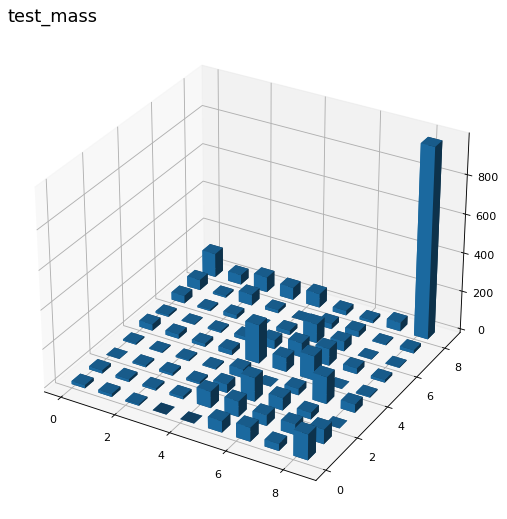

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =77


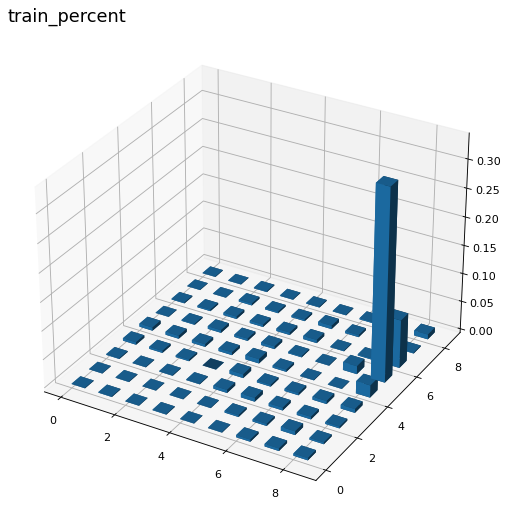

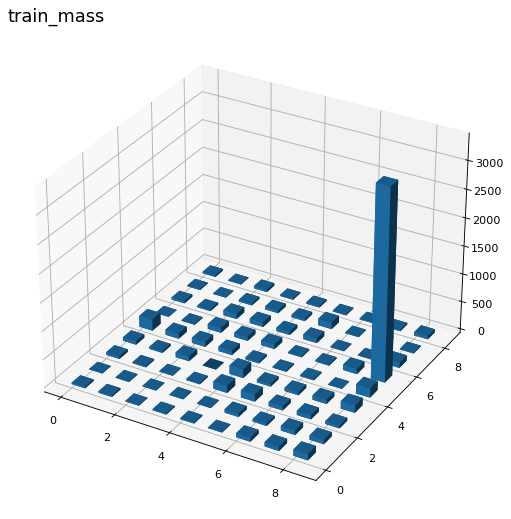

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =77


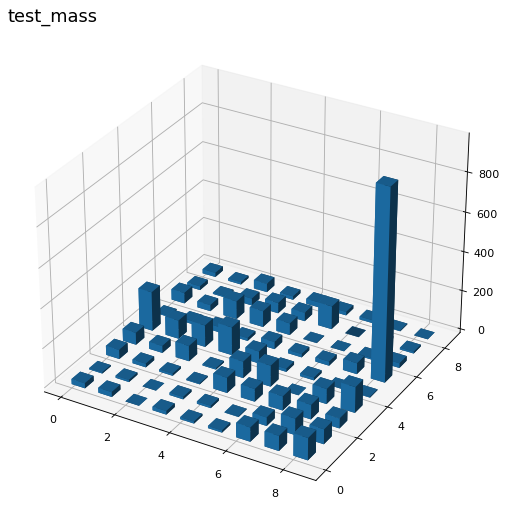

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =8


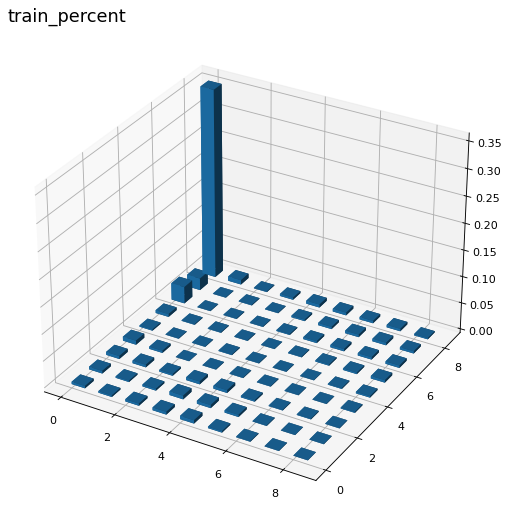

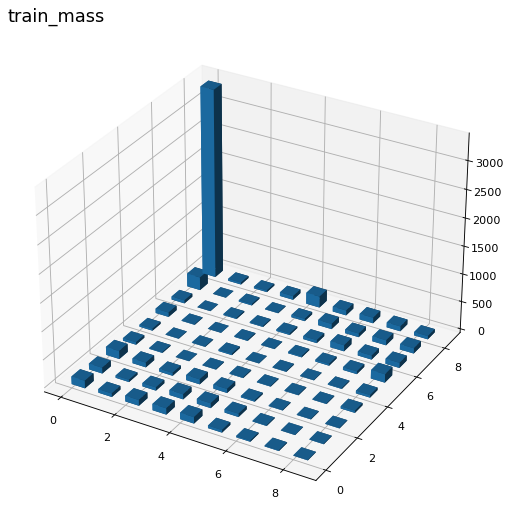

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =8


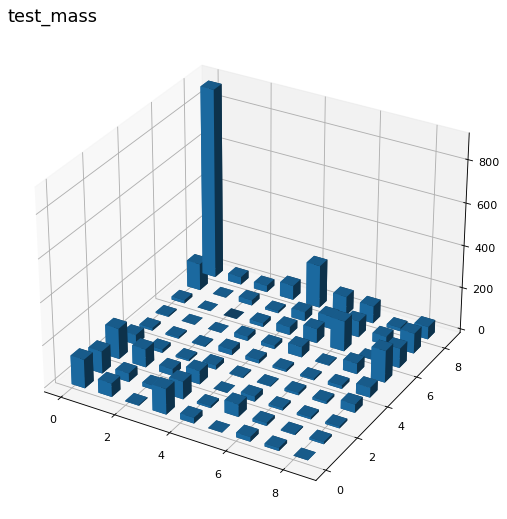

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =0


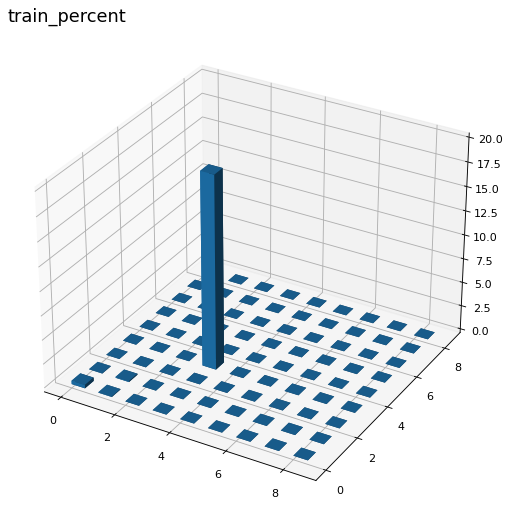

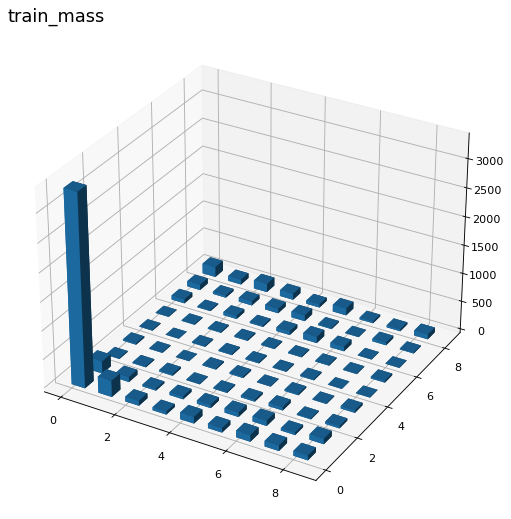

10236 element on été classé dans un cluster qui etait vide dans train
best_cluster test =0


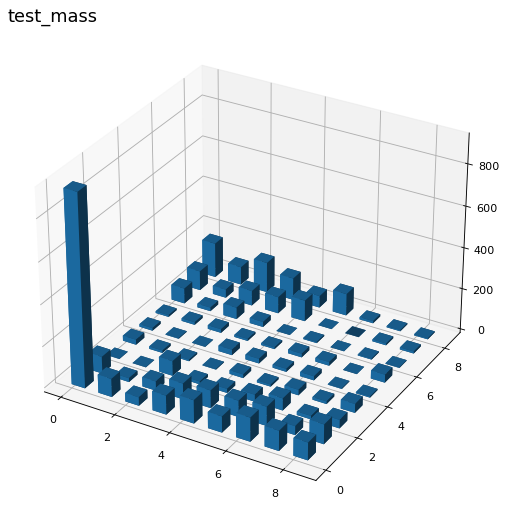

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =8


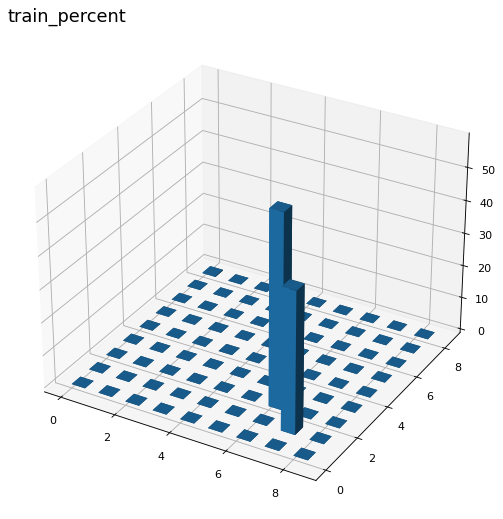

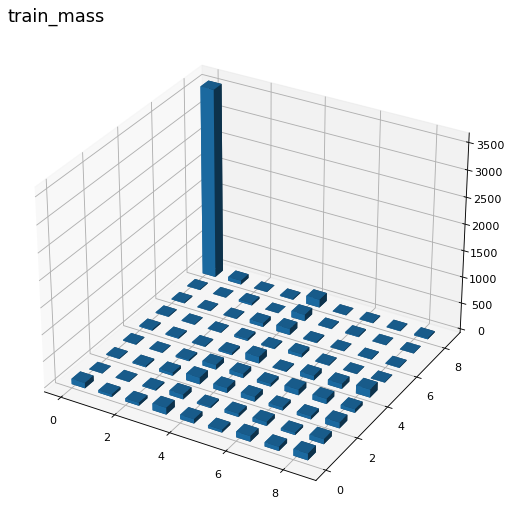

1527 element on été classé dans un cluster qui etait vide dans train
best_cluster test =8


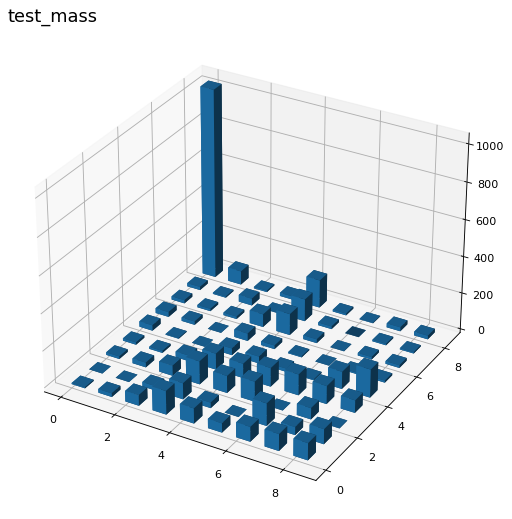

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =75


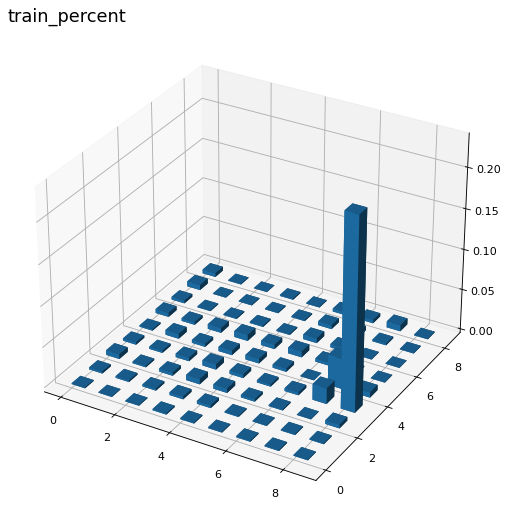

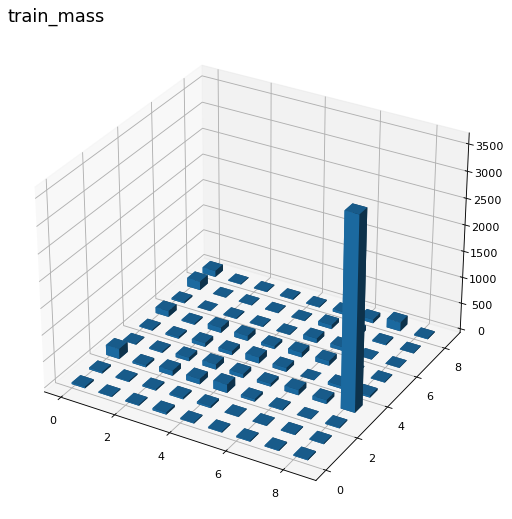

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =75


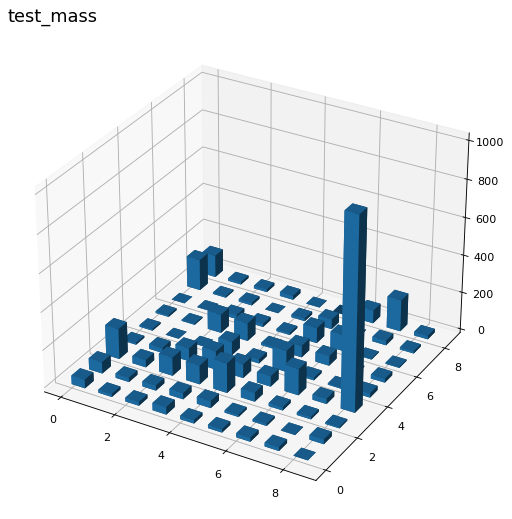

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =60


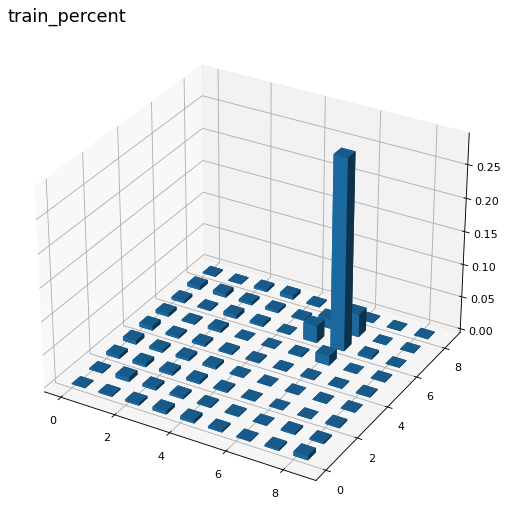

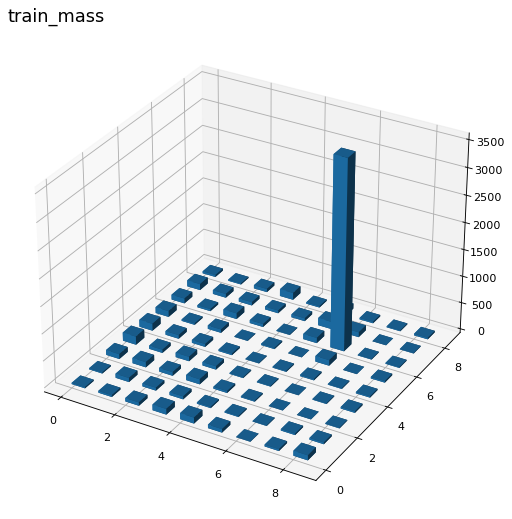

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =60


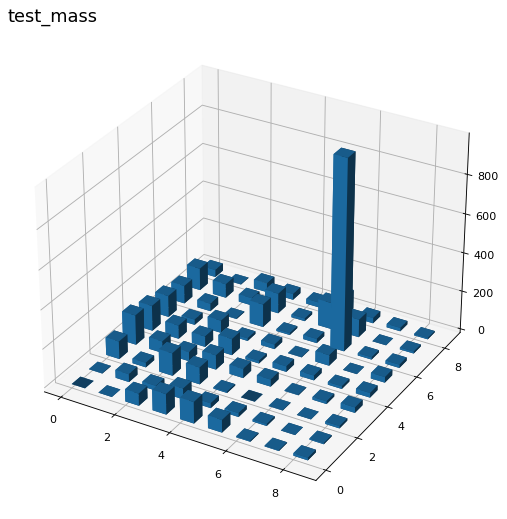

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =53


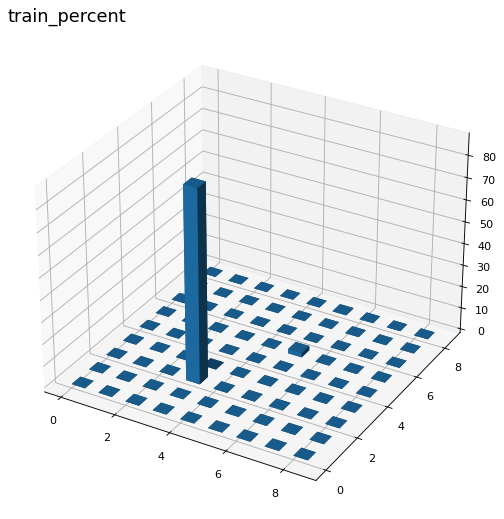

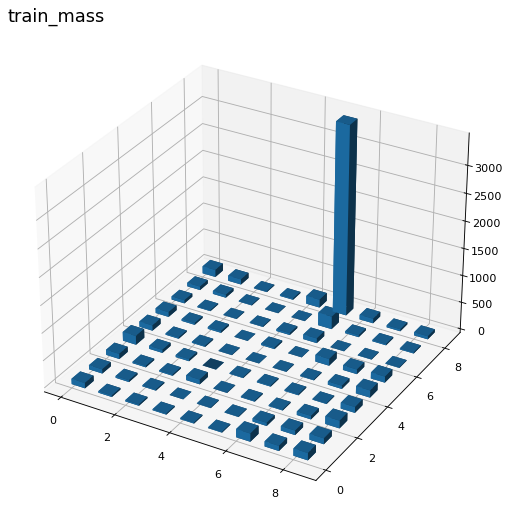

771 element on été classé dans un cluster qui etait vide dans train
best_cluster test =53


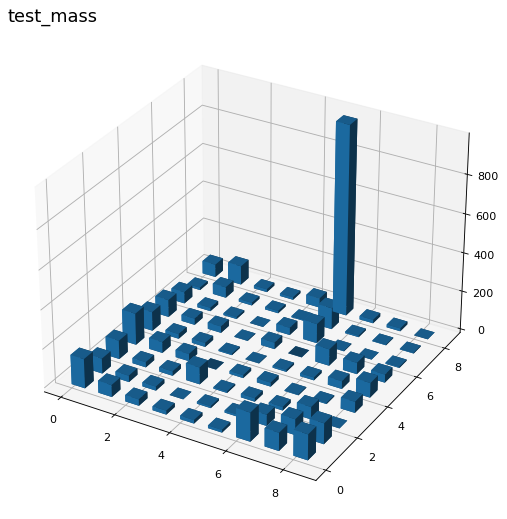

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =8


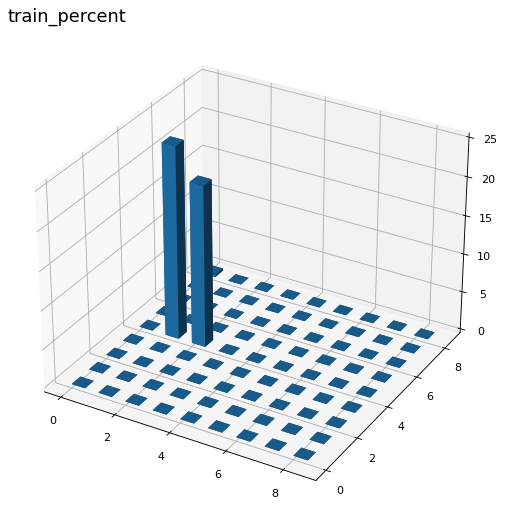

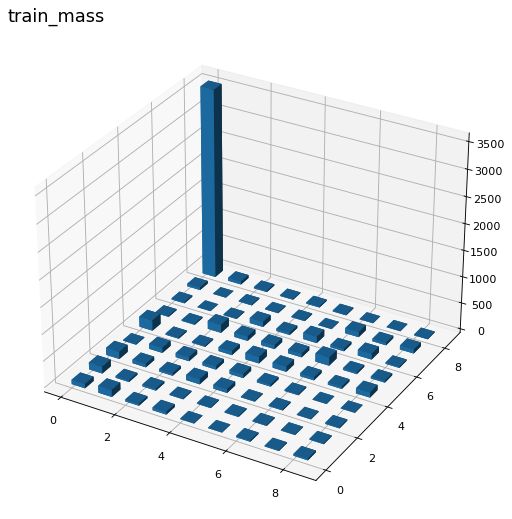

179 element on été classé dans un cluster qui etait vide dans train
best_cluster test =8


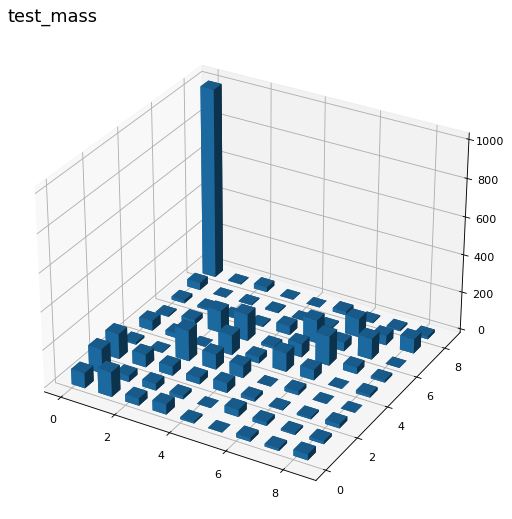

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =44


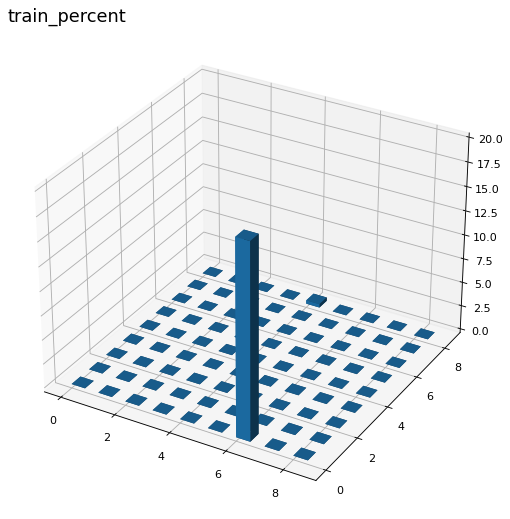

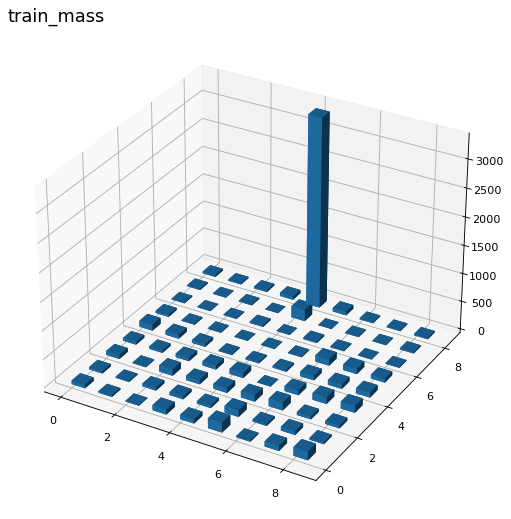

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =44


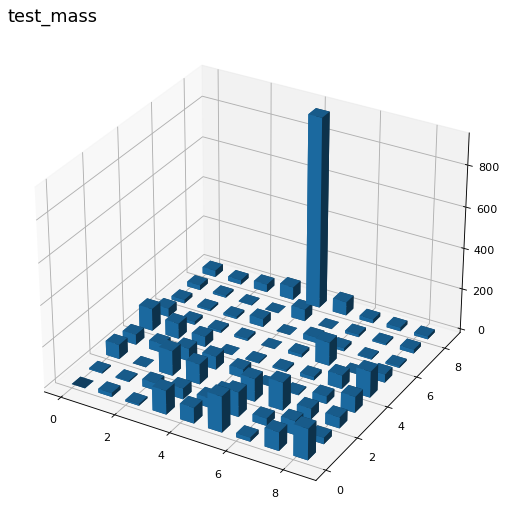

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =8


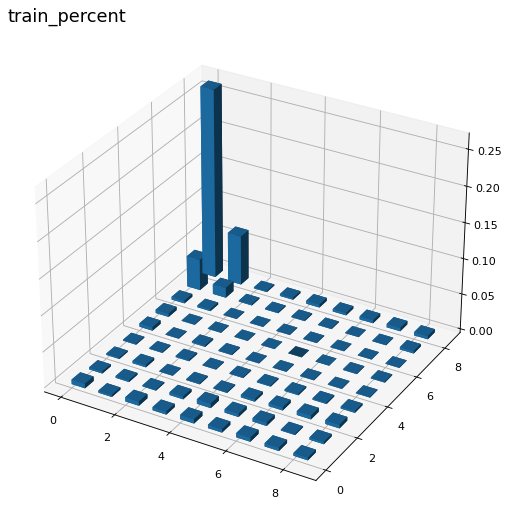

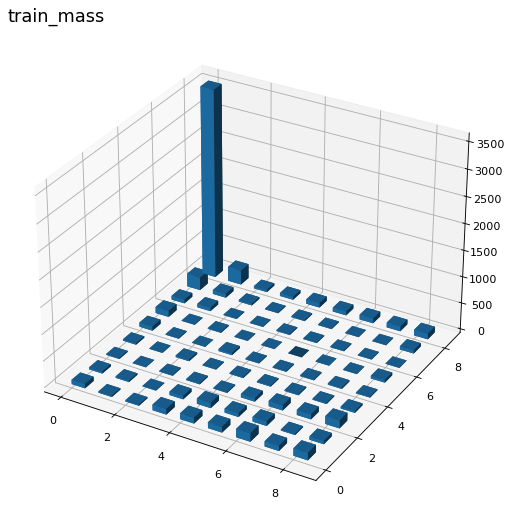

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =8


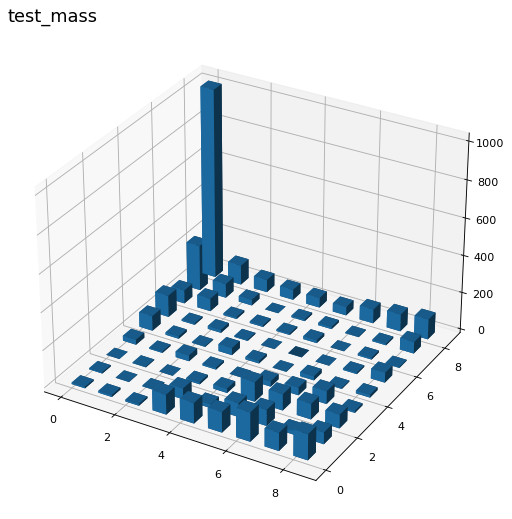

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =78


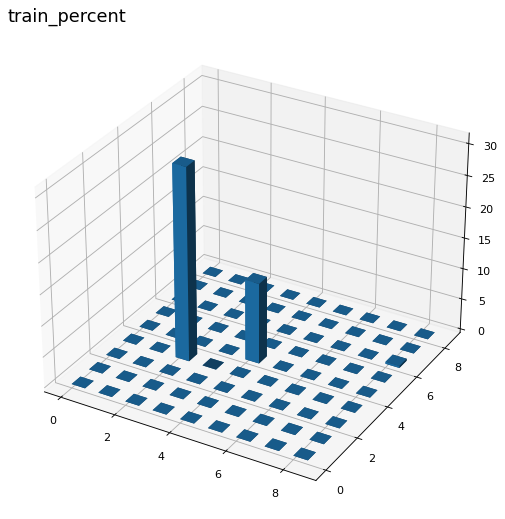

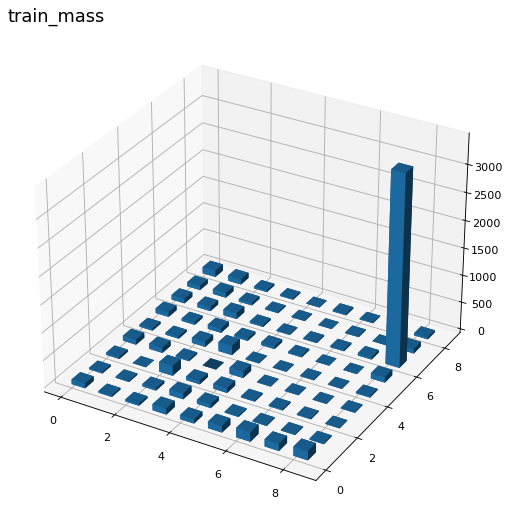

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =78


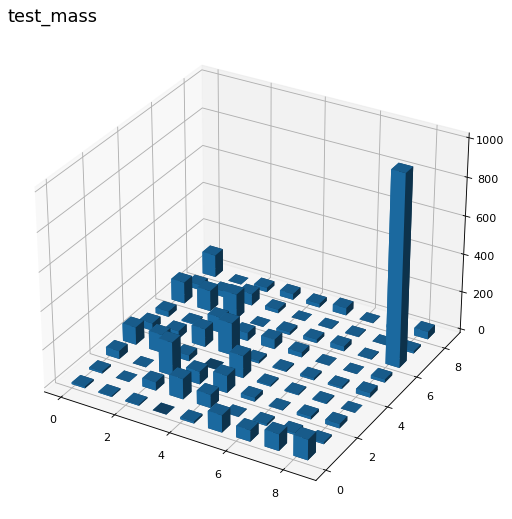

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =80


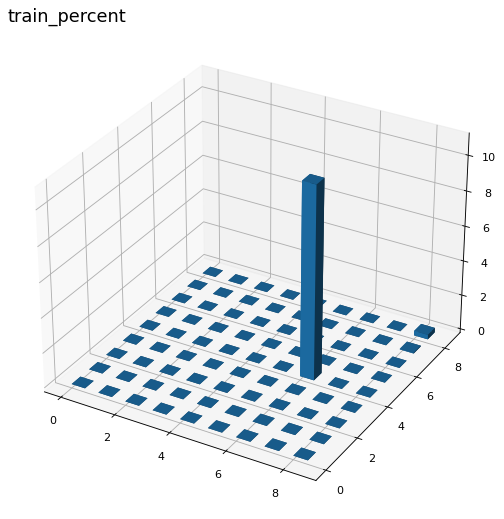

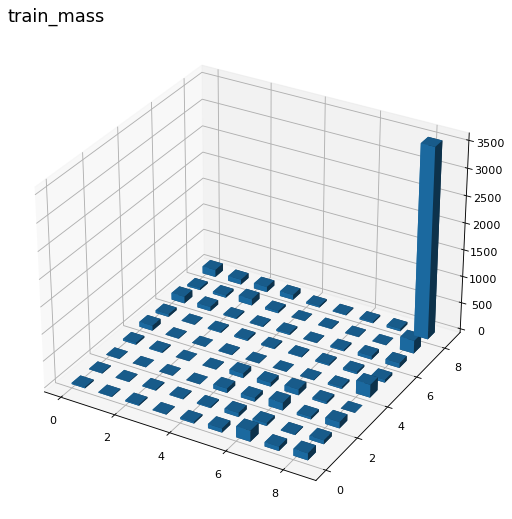

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =80


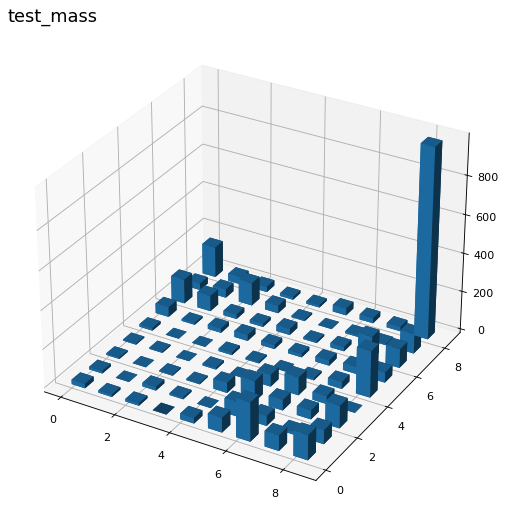

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =76


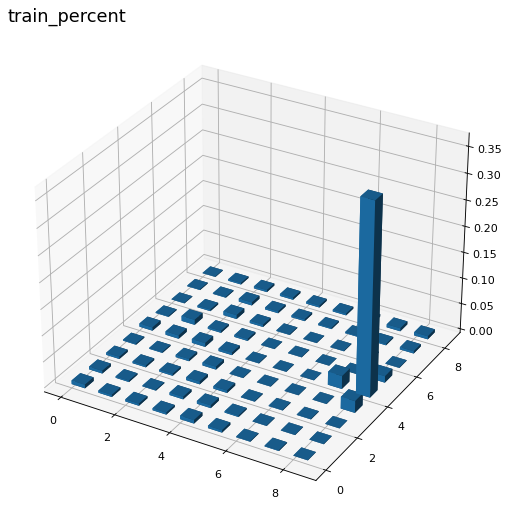

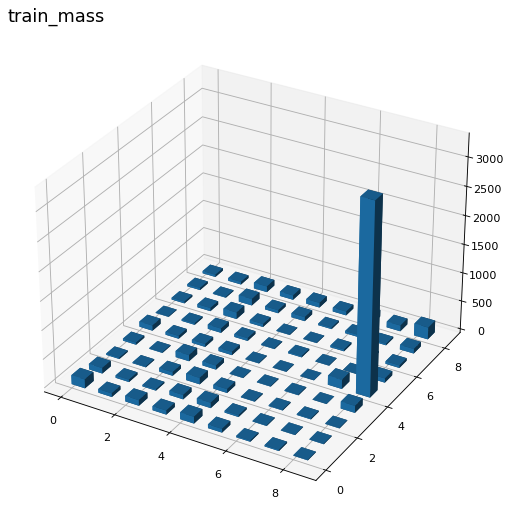

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =76


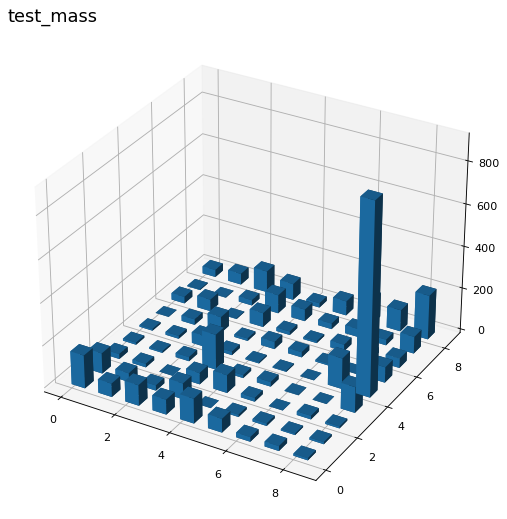

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =44


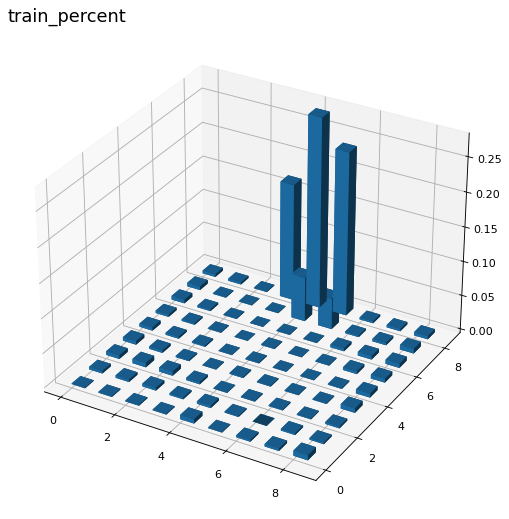

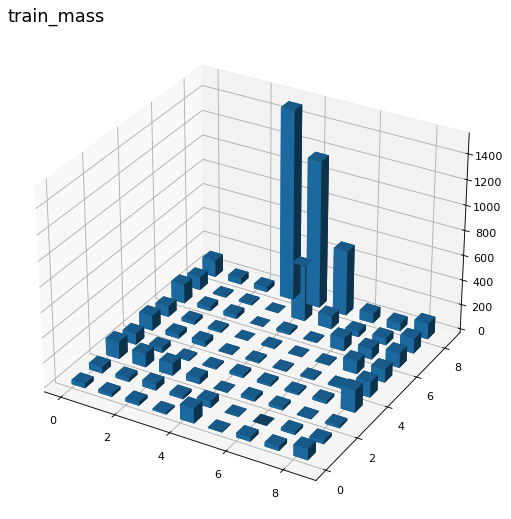

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =44


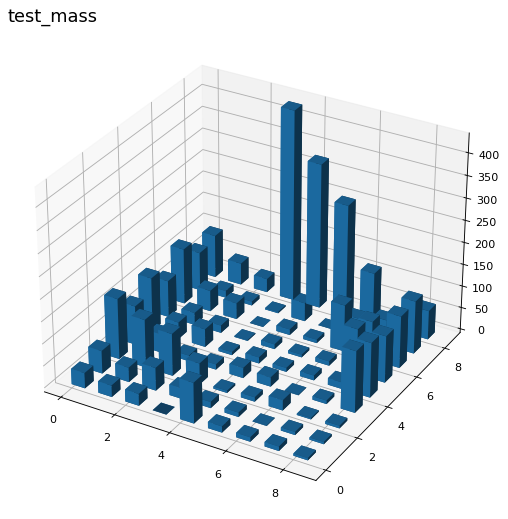

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =0


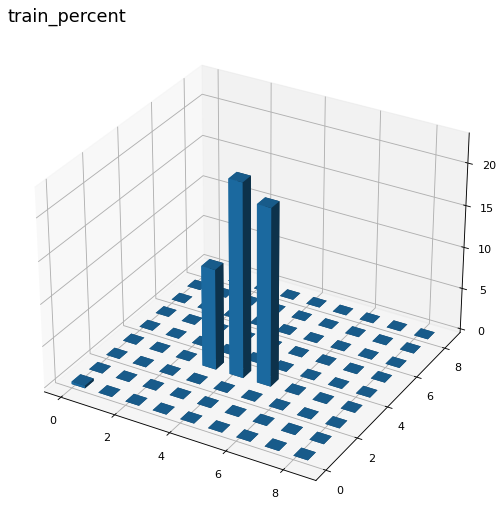

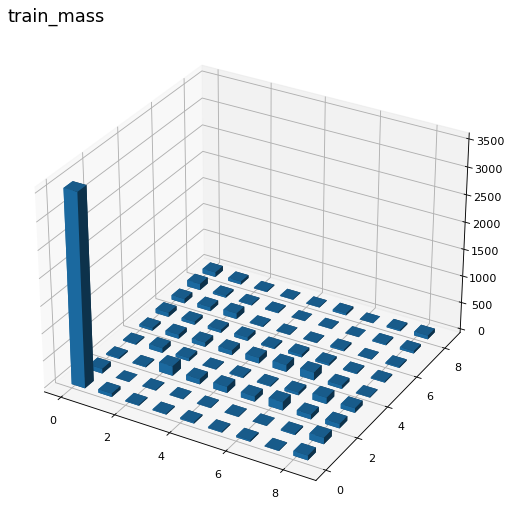

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =0


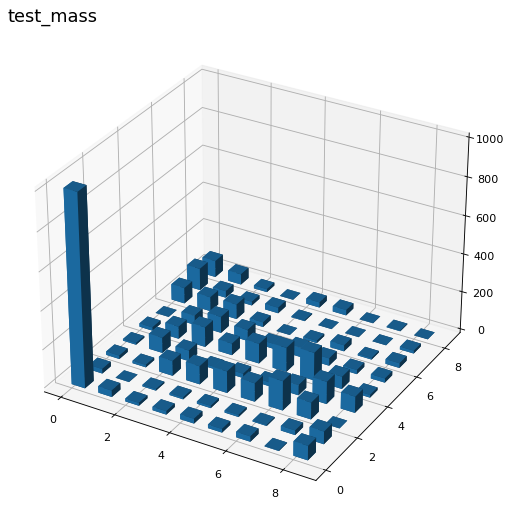

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =75


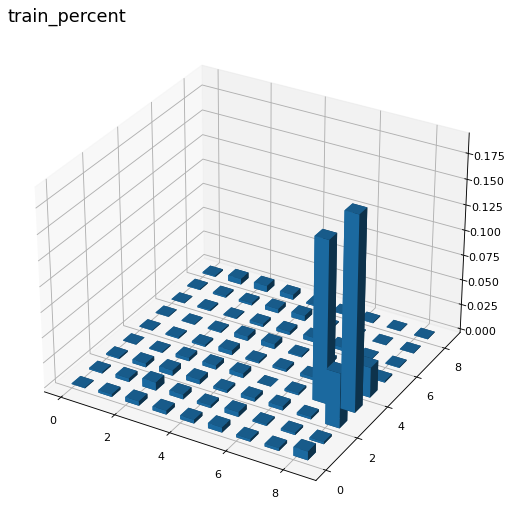

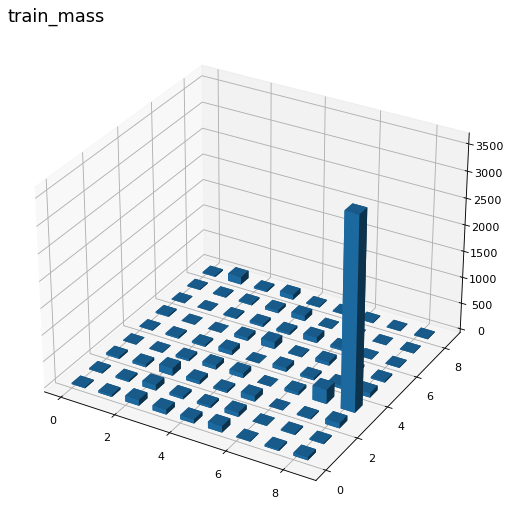

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =75


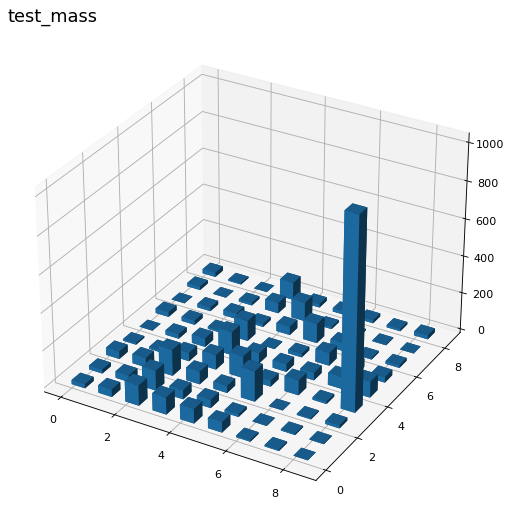

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =72


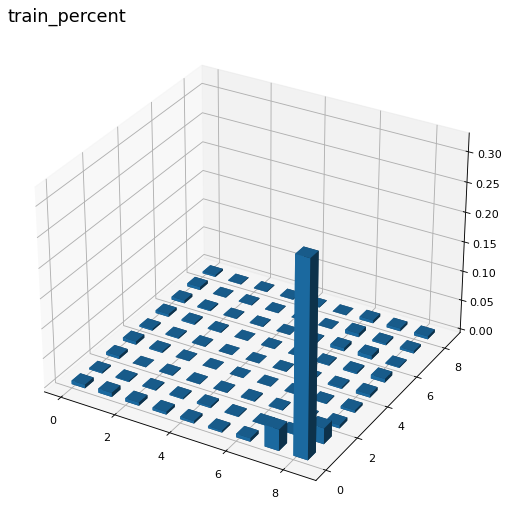

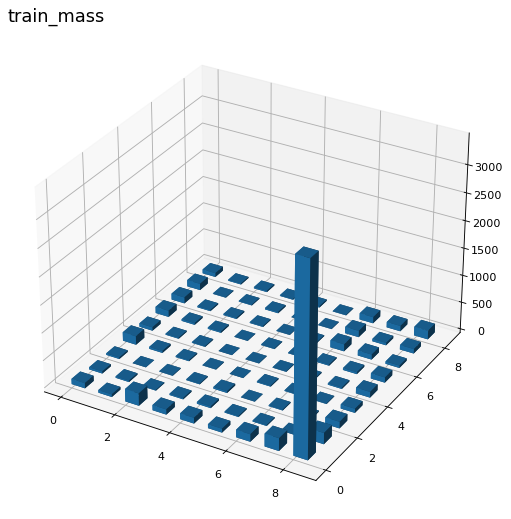

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =72


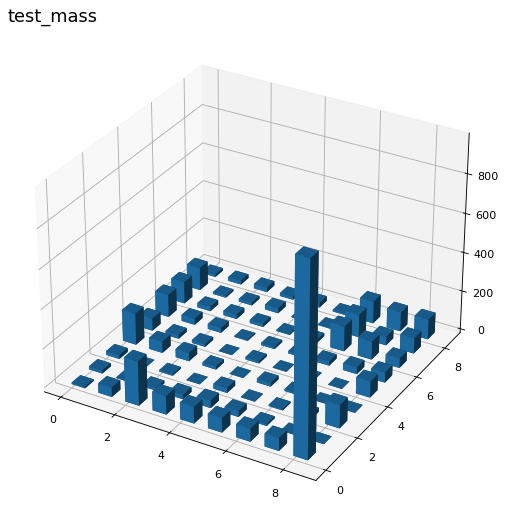

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =75


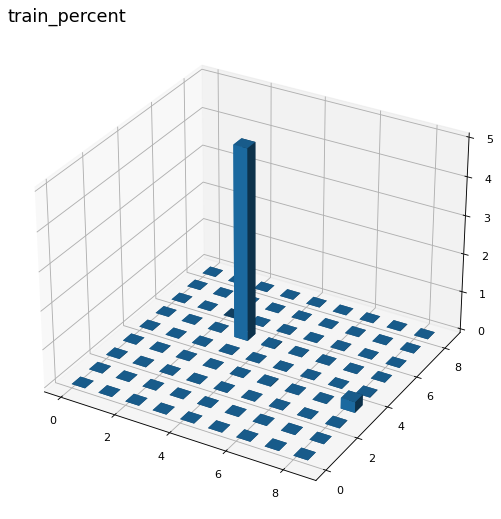

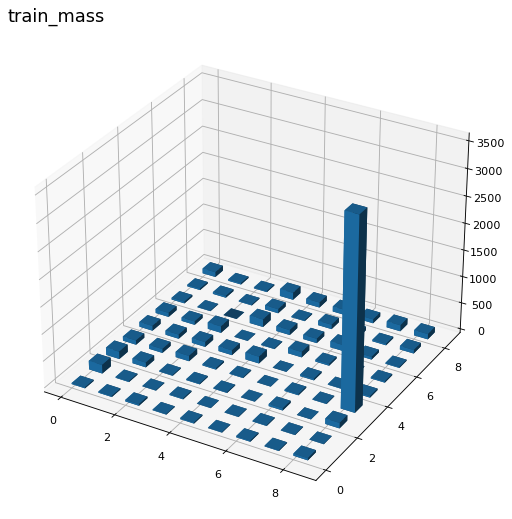

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =75


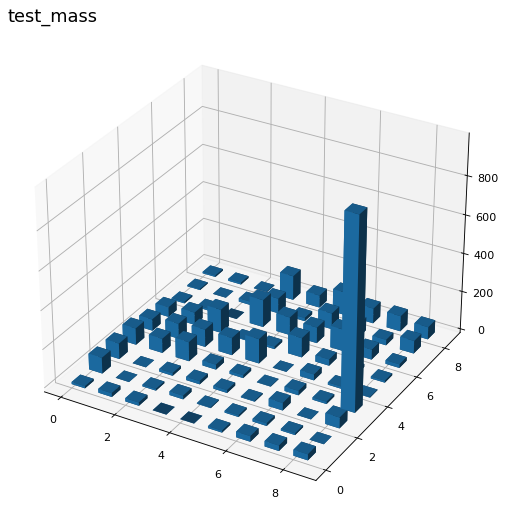

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =75


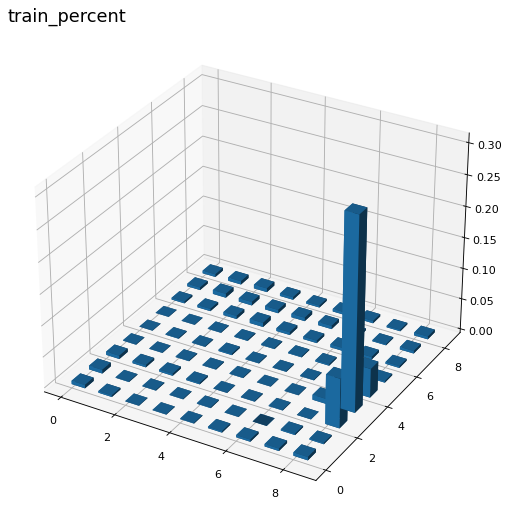

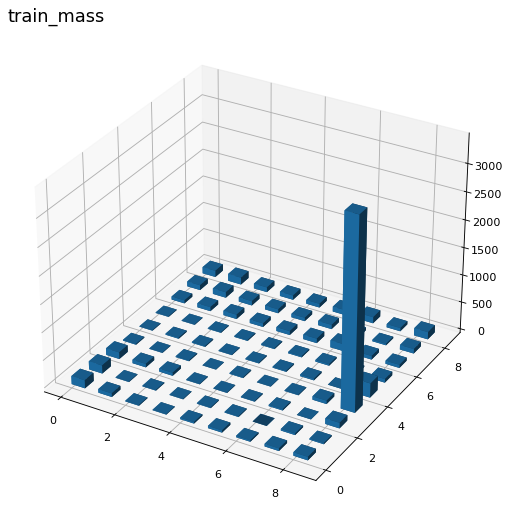

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =75


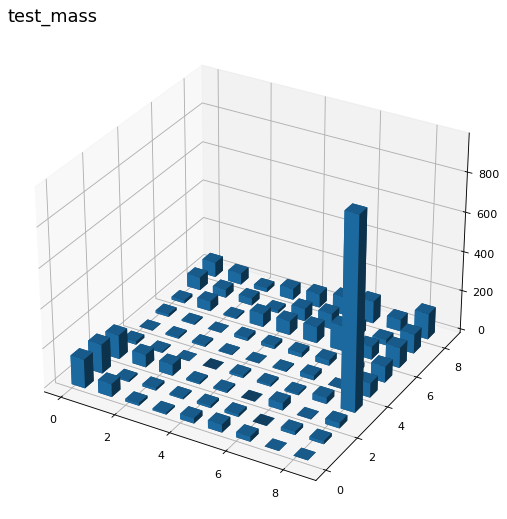

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =0


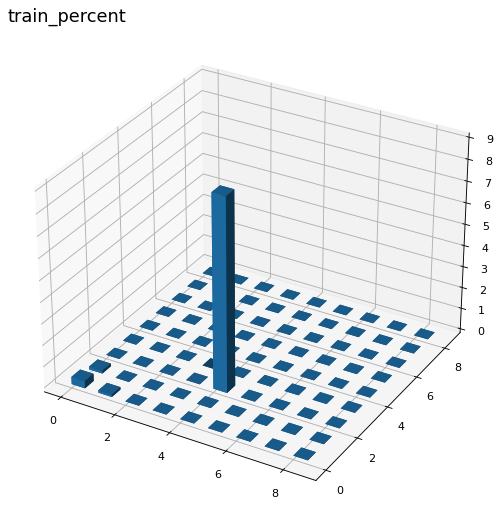

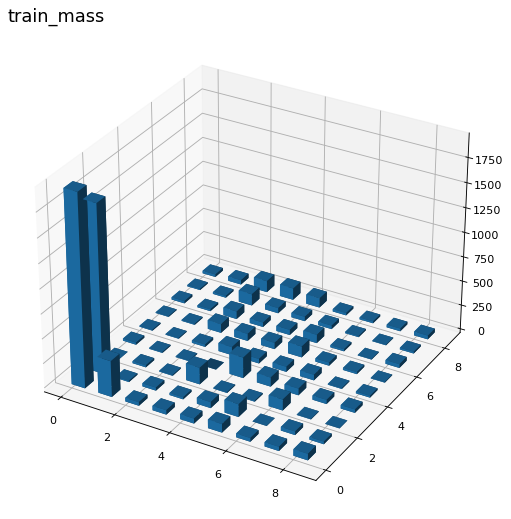

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =0


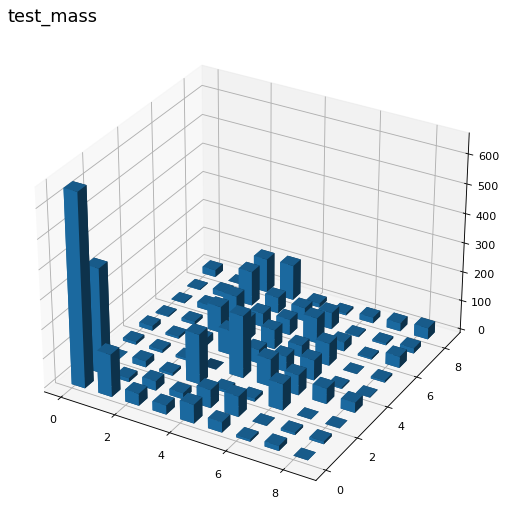

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =72


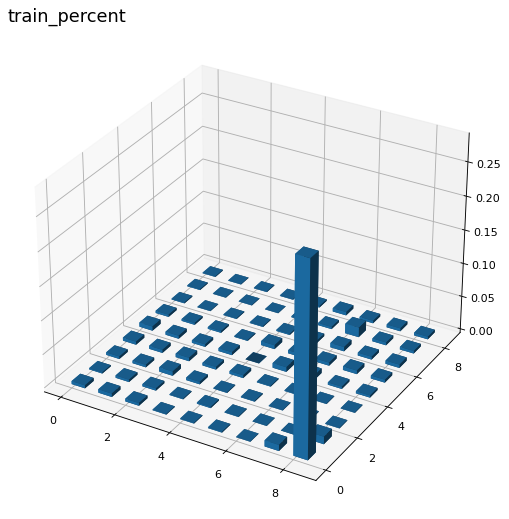

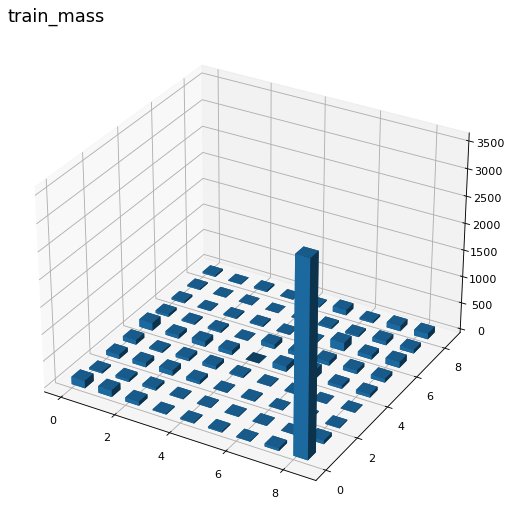

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =72


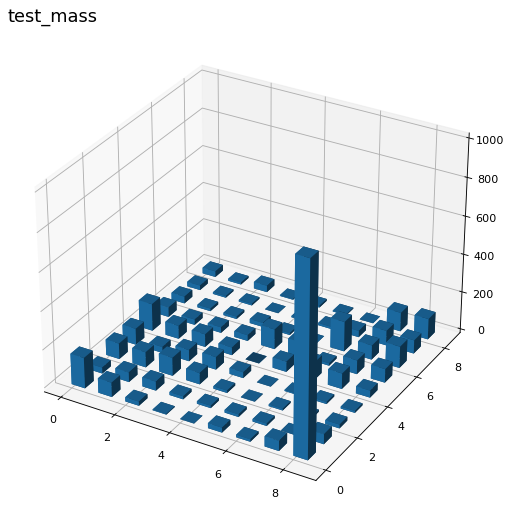

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =0


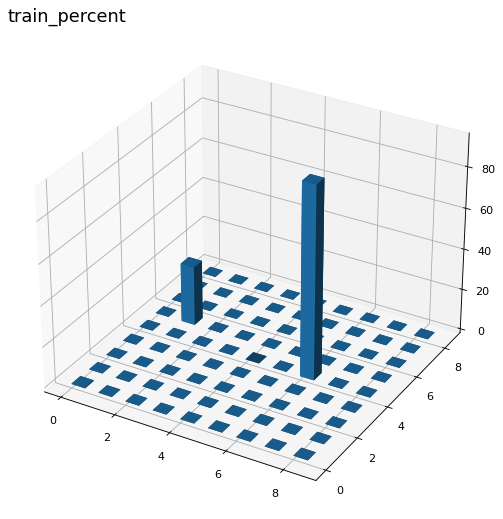

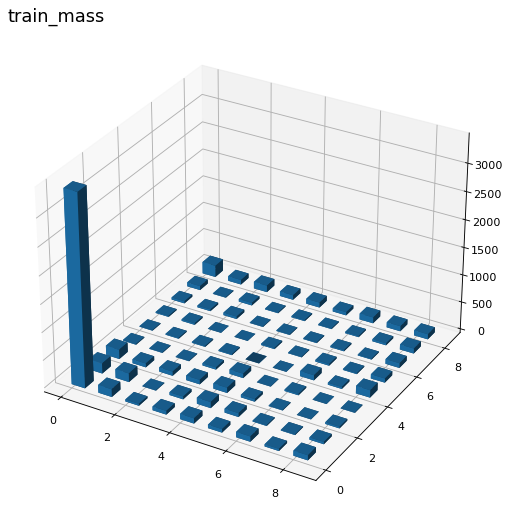

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =0


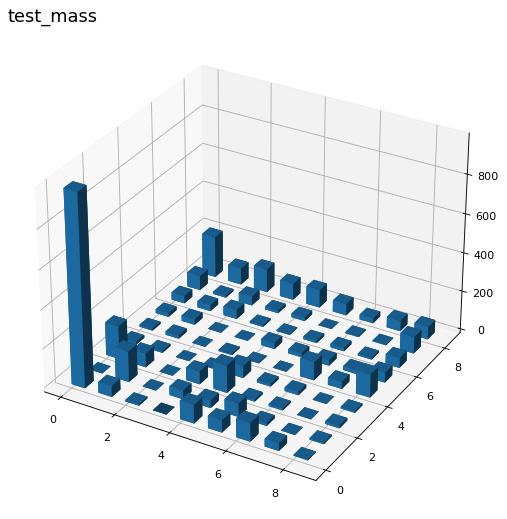

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =62


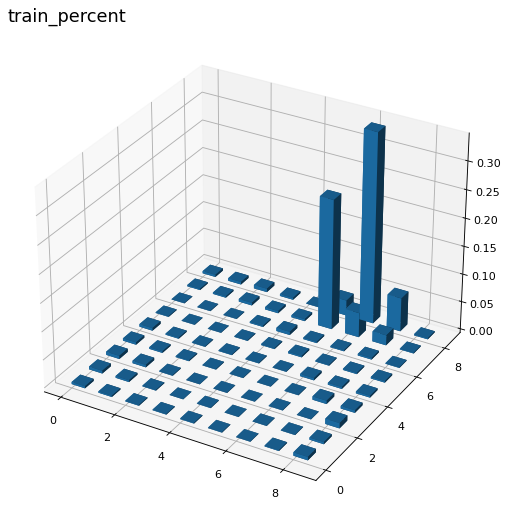

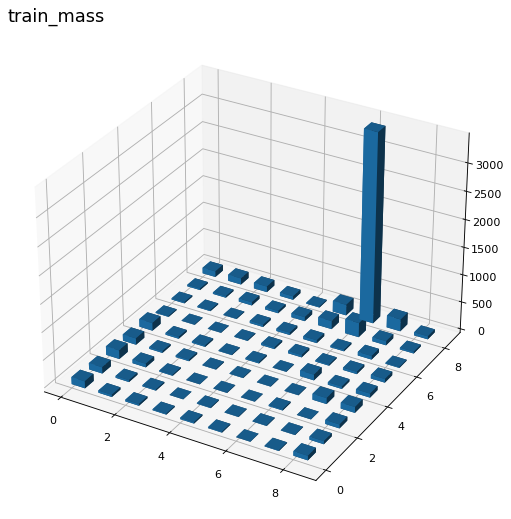

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =62


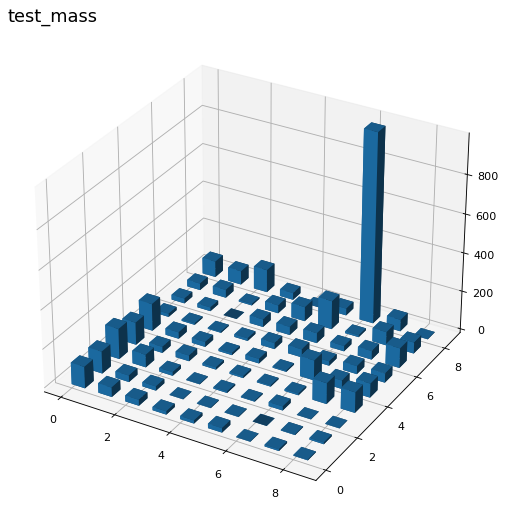

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =80


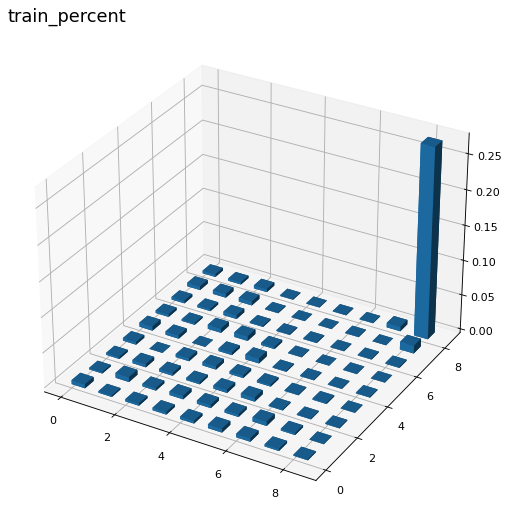

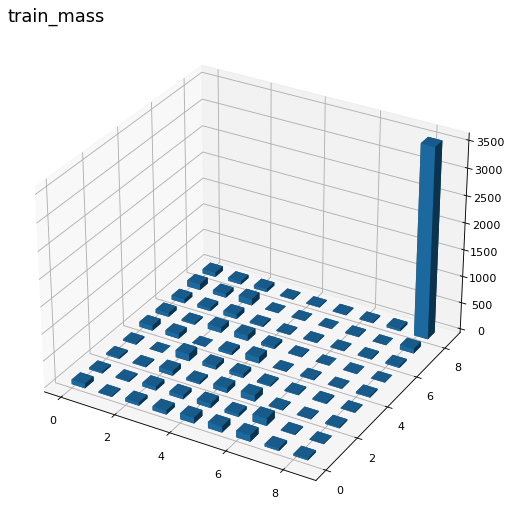

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =80


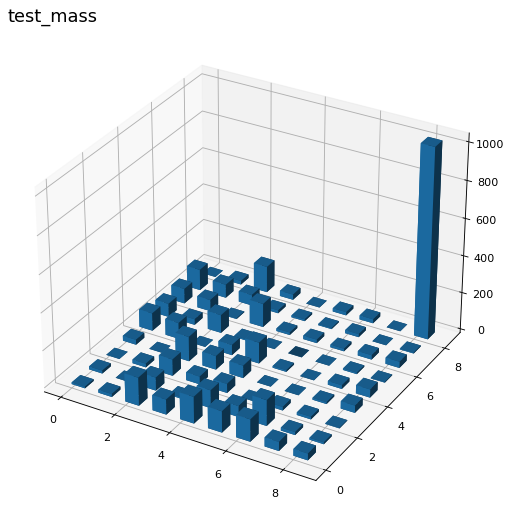

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =72


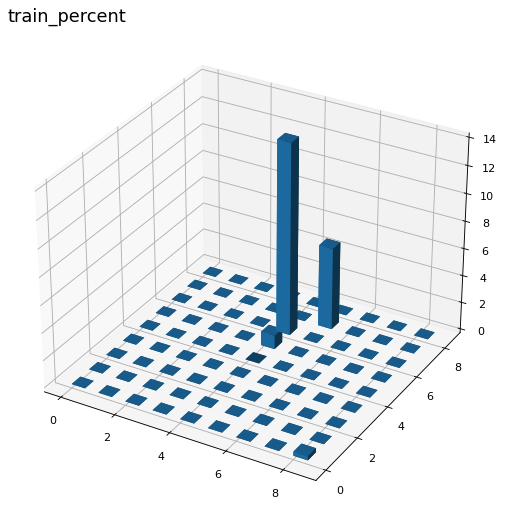

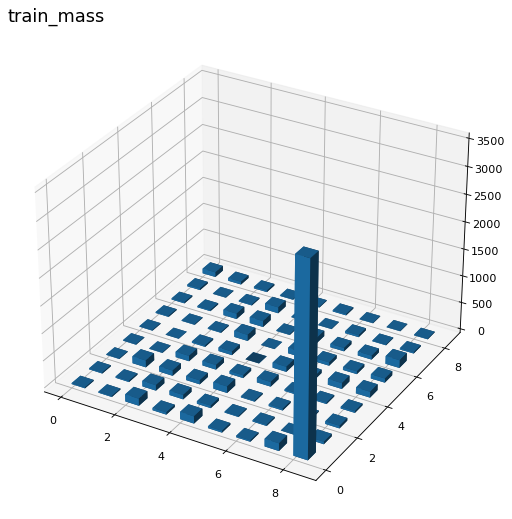

55 element on été classé dans un cluster qui etait vide dans train
best_cluster test =72


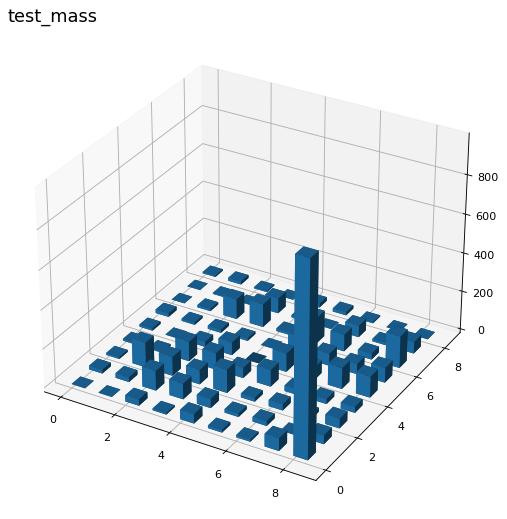

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =77


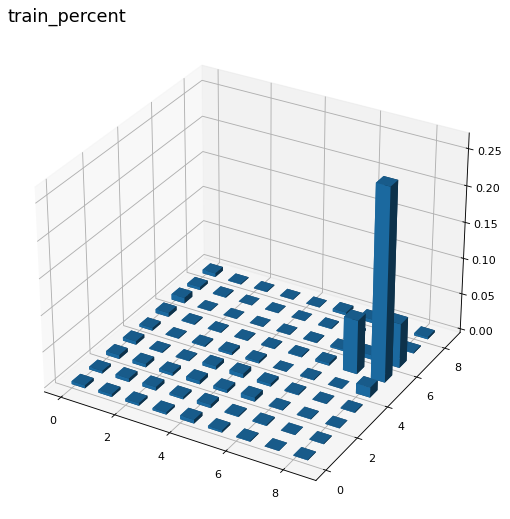

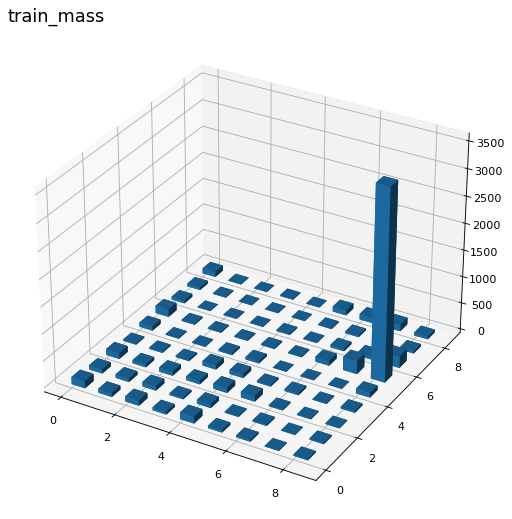

0 element on été classé dans un cluster qui etait vide dans train
best_cluster test =77


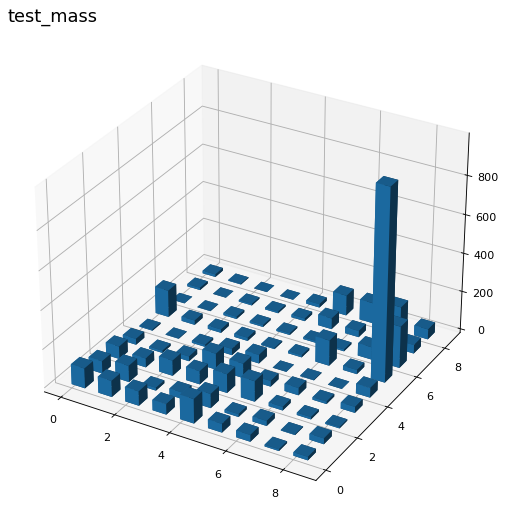

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------
max_iter atteint
best_cluster train =80


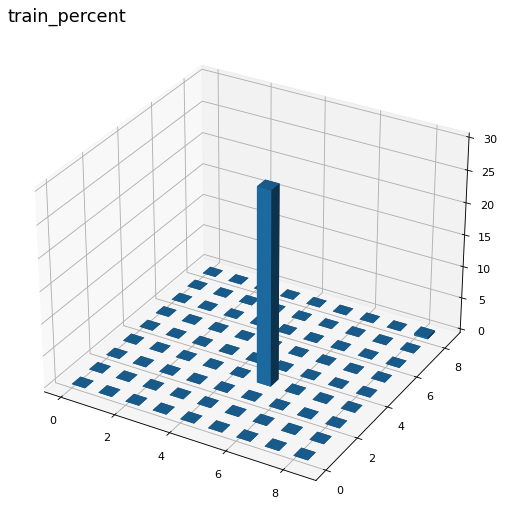

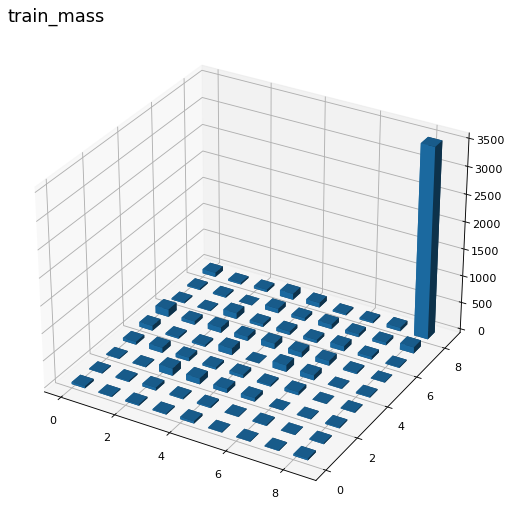

6147 element on été classé dans un cluster qui etait vide dans train
best_cluster test =80


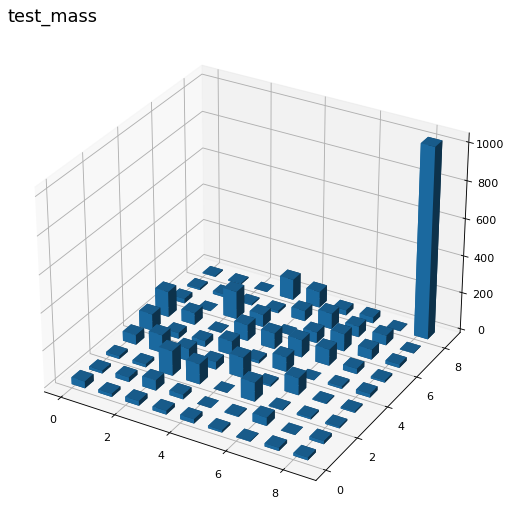

-----------------------------------------------------------
-----------------------------------------------------------
-----------------------------------------------------------


In [131]:
###############################################################################
###############################################################################
###############################################################################
index =0
saving=reset(saving)
saving_train=reset(saving_train)
saving_test=reset(saving_test)
while (index<nombre_de_models):
    #calcul
    som = SOM(m=largeur, n=longueure, dim=7,max_iter=100000)# , max_iter = 1)
    som.fit(X_train_transformed, epochs =1)
    predictions = som.predict(X_train_transformed)
    #sauvgarder les resultats
    tab_nb_fraud=generate_nb_fraud("train")
    percent=generate_percent()
    save(mode="train")
    #afficher
    print("best_cluster train ="+str(best_cluster()))
    z[list(percent.keys())] = list(percent.values())
    affiche(z,"train_percent")
    z[list(tab_nb_fraud.keys())] = list(np.array(list(tab_nb_fraud.values()))[:,1])
    affiche(z,"train_mass")

    
    #essai sur test
        #j'associe un cluster a chaque data
    predictions = som.predict(X_test_transformed)
    tab_nb_fraud=generate_nb_fraud("test")#pour afficher
    #percent=generate_percent()
    
    save(mode="test")  #<----- j'enregistre le % du cluster de chaque data 
            # % qui n'a pas été mis a jour donc il s'agit du % de train
    #afficher
    print("best_cluster test ="+str(best_cluster()))
    z[list(tab_nb_fraud.keys())] = list(np.array(list(tab_nb_fraud.values()))[:,1])
    affiche(z,"test_mass")
    
    print("-----------------------------------------------------------")
    print("-----------------------------------------------------------")
    print("-----------------------------------------------------------")
    index=index+1

In [161]:

trying=probably_10_best_clusters()
print("-------------------")
print(trying)
print("-------------------")
moy=sorted(moyenne_qui_passe_certaines_saves(),reverse=True)
print(moy[0])


-------------------
[[0.22720025571681923, 1626], [0.22642580428631742, 267], [0.22507150145465335, 406], [0.2231709154494859, 11], [0.22239646401898408, 2], [0.2221698938909938, 158], [0.2218521655892593, 2], [0.22104216118732, 6], [0.22081559105932974, 299], [0.21931547704478502, 1]]
-------------------
0.22720025571681923
(1296675, 7)
(555719,)
[74 55 39 57 73 39 32 55 75 32 57 33 39 41 39 45 66 24 55 36 46 15 74 46
 46 24 49 65 63  8 73 39 74 55 31 41 65 39 49 74 24 17 57 63 42 23 49 47
 37 24]


camembert montrant combien de fraudes il y a dans chaque clusters 

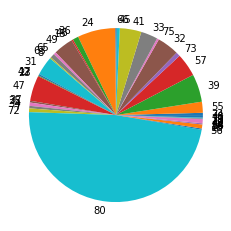

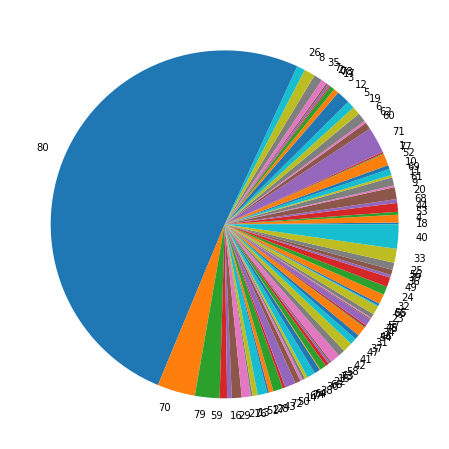

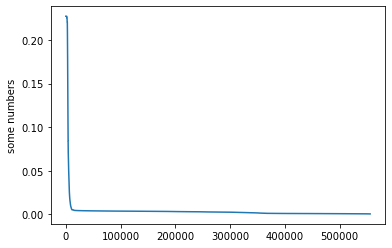

3091 values au dessus de 20% 
5265 values au dessus de 5% 
7024 values au dessus de 2% 


In [170]:

affiche_moyenne()

In [ ]:

#to read
#http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.697.8197&rep=rep1&type=pdf

In [ ]:
# assosier les pourcents de chaques donnée sachant son cluster
#percent contien le pourcent associé a chaques cluster
#prediction contien le cluster a qui appartien chaques donnée


In [ ]:
#on va calculer un knonene ---> on a des cluster ---> on a des pourcents 
# on va utilise ce konenen sur les donnée val pour le atribuée des cluster 
# donc on peut leur attribuer des pourcents 
#on recomence 50 fois , et on fait la moyenne min 5 H d'execution
#


In [88]:
#etape de test
#test 1
#en premier j'ai testé mes data en trichant pour voir si ca faisait nimporte quoi
#j'ai train SOM_train sur Train
#j'ai executé SOM_train sur train ,calculer les % avec y_train,  affiche
#j'ai executé SOM_train sur test  ,calculer les % avec y_test ,  affiche
#les courbes etait tres similaires 
#a noter que je recalculais les % des cluster en utilisant y_test
# donc je ne doit pas m'en servir normalement
#test 2
#j'ai train SOM_train sur Train
#j'ai executé SOM_train sur train ,calculer les % avec y_train,  affiche
#j'ai executé SOM_train sur test  
# calculer les % avec les percent de cluster obtenu dans le training
#afficher
#c'est prometteur

In [ ]:
#ajouter les pourcent comme une nouvelle colonne
X_train_transformed['percent'] = moyenne()
X_train_transformed_percent = X_train_transformed.copy()



In [163]:
#tester avec des données plus compliqué
print(xtrain_transformed_complique.shape)
print(ytrain_transformed_complique.shape)


(1037340, 32)
(259335,)


In [171]:
objet=[0,0]
liste=[]
objet[0]= 0.1545
objet[1]=15
liste.append(objet[:])
print(liste)
objet[0]=0.2
objet[1]=655
liste.append(objet[:])
print(liste)
objet[0]=0.32
objet[1]=258
liste.append(objet[:])
print(liste)
print(objet)
objet[0]=0.5
objet[1]=885
liste.append(objet[:])
print(liste)

liste[0].append(-1)
print(liste)


[[0.1545, 15]]
[[0.1545, 15], [0.2, 655]]
[[0.1545, 15], [0.2, 655], [0.32, 258]]
[0.32, 258]
[[0.1545, 15], [0.2, 655], [0.32, 258], [0.5, 885]]
[[0.1545, 15, -1], [0.2, 655], [0.32, 258], [0.5, 885]]


In [196]:
print(len(moy))
print(type(X_test_transformed[0]))
print(len(X_test_transformed[0]))

555719
<class 'numpy.ndarray'>
7


In [201]:
#dictionary_keys= globals().keys
#print(dictionary_keys)
#for name in dictionary:    
#    print(globals()[name])

In [59]:
global_object=1
print (id(global_object))
def fooo():
    global_object=2
fooo()
print(global_object)
print(type(global_object))

140709781382960
1
<class 'int'>


In [287]:
print(id(saving_test))
save()

print(id(saving_train))
save(mode="train")


2725896504704
2725889772736
2725896504704
555719 element on été classé dans un cluster qui etait vide dans train
2725889772736
2725889772736
2725889772736
555719 element on été classé dans un cluster qui etait vide dans train


In [73]:

print(id(saving_train))
reset()
print(id(saving_train))

2202456163136
2202456163136


In [340]:
#reset()

In [68]:
print(tab_nb_fraud)
tab_nb_fraud=generate_nb_fraud()
print("---")
print((tab_nb_fraud))

{21: [20606, 40], 37: [27532, 104], 6: [20384, 14], 7: [13570, 78], 23: [26551, 101], 41: [20879, 127], 19: [18880, 33], 42: [18108, 111], 31: [24056, 147], 15: [13699, 26], 8: [22701, 136], 4: [22401, 24], 76: [4755, 29], 78: [17602, 21], 33: [20807, 91], 27: [13396, 15], 18: [23915, 28], 28: [12980, 45], 24: [16854, 85], 29: [9994, 20], 36: [17659, 94], 77: [24787, 28], 63: [15262, 44], 30: [12551, 60], 5: [22579, 10], 20: [16774, 9], 16: [14072, 78], 73: [8376, 20], 75: [12746, 3567], 54: [3634, 23], 72: [11718, 69], 13: [12544, 6], 32: [35, 0], 14: [11013, 7], 64: [14374, 17], 74: [1295, 98], 79: [18010, 22], 38: [15724, 82], 12: [10940, 2], 66: [5306, 199], 3: [7808, 10], 45: [24023, 82], 40: [13952, 53], 50: [14043, 61], 51: [14278, 80], 65: [2628, 8], 55: [3225, 16], 39: [19187, 93], 80: [26347, 16], 68: [18356, 19], 25: [14682, 69], 11: [16104, 14], 69: [8371, 10], 17: [16246, 73], 10: [13760, 5], 34: [12885, 58], 46: [19471, 43], 67: [8088, 11], 43: [13299, 65], 70: [13182, 12

In [64]:
print(percent)
percent=generate_percent()
print(percent)

{}
{21: 0.001937421292260002, 37: 0.003763207410623824, 6: 0.0006863417982155113, 7: 0.0057151230949589685, 23: 0.003789584271349242, 41: 0.00604589165000476, 19: 0.001744831597314017, 42: 0.006092540754157747, 31: 0.0060736272362930215, 15: 0.0018943533697632058, 8: 0.00595524806235495, 4: 0.0010702341137123746, 76: 0.006061872909698997, 78: 0.0011916245815127959, 33: 0.004354483682649057, 27: 0.0011184848258891955, 18: 0.0011694440963956063, 28: 0.00345489443378119, 24: 0.005018005785465494, 29: 0.0019972039145196726, 36: 0.0052948797386357235, 77: 0.0011283497884344146, 63: 0.00287468966418398, 30: 0.004757751169613829, 5: 0.0004426933463190048, 20: 0.0005362569266519693, 16: 0.005512367491166078, 73: 0.0023820867079561697, 75: 0.21865996444553423, 54: 0.006289308176100629, 72: 0.005853906846525834, 13: 0.00047808764940239046, 32: 0.0, 14: 0.0006352087114337568, 64: 0.0011812938642206934, 74: 0.07035175879396985, 79: 0.0012200532386867791, 38: 0.005187903327850183, 12: 0.00018278194

In [119]:
print("prediction = ",id(predictions))
print("percent    = ",id(percent))
print("----")
reset()
def fuio():
    tab_nb_fraud=generate_nb_fraud("train")
    percent=generate_percent()
    save(mode="train")

prediction =  2203869763184
percent    =  2203455271680
----


In [122]:

fuio()
print((saving_train[0][0:5]))
print(len(saving_train[0]))

prediction =  2203869763184  prediction_size  1296675
percent    =  2203455271680
une_iteration    =  1296675
2202456163136
0 element on été classé dans un cluster qui etait vide dans train
prediction fin de save =  2203869763184
percent    fin de save =  2203455271680
[0.001937421292260002, 0.003763207410623824, 0.0006863417982155113, 0.0057151230949589685, 0.003789584271349242]
1296675


In [123]:
print(len(saving_train))

2


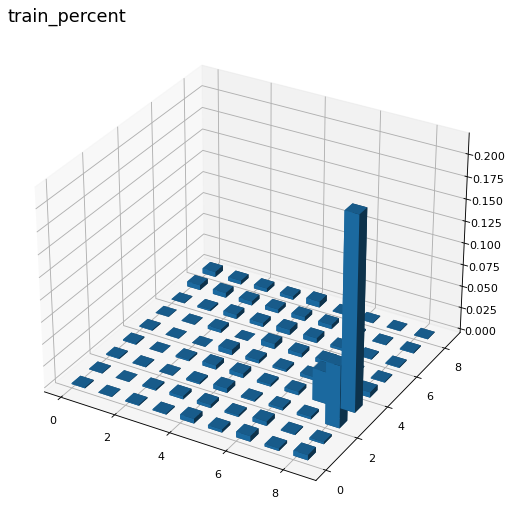

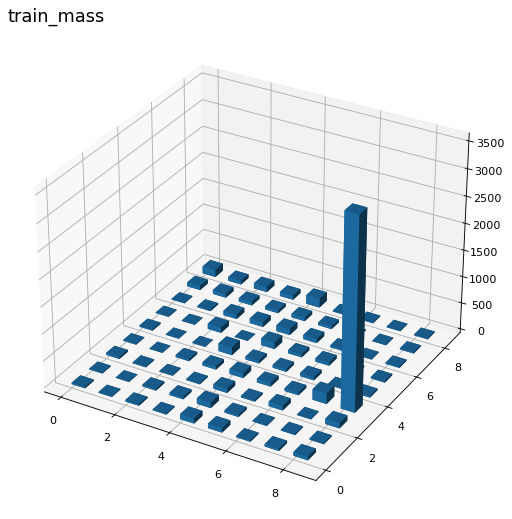

In [74]:
z[list(percent.keys())] = list(percent.values())
affiche(z,"train_percent")
z[list(tab_nb_fraud.keys())] = list(np.array(list(tab_nb_fraud.values()))[:,1])
affiche(z,"train_mass")

In [107]:
print(len(saving_test[1]))
print(len(predictions))

1296675
1296675
